# **Process Mining of a Loan Application Process**

## **1 - Import Required Libraries & Function Definition**

### Import libraries

In [2]:
import os
import io
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from dotenv import load_dotenv
import google.generativeai as genai
import pm4py
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.convert import convert_to_event_log

/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 272, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:


Not patching Numba
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.11/dist-packages/cudf/utils/gpu_utils.py:62: UserWarning: Failed to dlopen libcuda.so.1
  warnings.warn(str(e))


### Setup

In [3]:
os.makedirs("figure", exist_ok=True)

In [4]:
sns.set_style("white")

In [ ]:
# Load variables from .env file
load_dotenv()

# Get the API key
api_key = os.getenv("GEMINI_API_KEY")

# Check if key is loaded
if not api_key:
    raise ValueError("ERROR: GEMINI_API_KEY not found in .env file!")

print(f"GEMINI API Key Loaded Successfully: {api_key[:5]}... (hidden for security)")

GEMINI API Key Loaded Successfully: AIzaS... (hidden for security)


### Function Definition for: Explore & Data Processing

In [5]:
def print_column_report(log, column="case:REG_DATE", report_desc="The starting date of the trace in the system."):
    """
    Prints a detailed report for a given column in the event log, including:
    - Data type and non-null count (info)
    - Descriptive statistics (describe)
    - A customizable report description

    Parameters:
    - log (pd.DataFrame): The event log DataFrame.
    - column (str): The column to analyze.
    - report_desc (str): Custom description of the column.

    Returns:
    - None (prints output to console)
    """
    print("\n===== COLUMN REPORT =====")
    print(f"📝 Report for `{column}` - {report_desc}")
    print("-------------------------------------------------------------------------------------")

    # Print column info
    print(log[column].info())
    print("-------------------------------------------------------------------------------------")

    # Print column statistics
    print(log[column].describe())
    print("-------------------------------------------------------------------------------------")


def remove_duplicates(log):
    """
    Cleans an event log by:
    1. Removing exact duplicate rows.
    2. Removing duplicate events within each case.
    3. (Optional) Removing duplicate activities across all cases.

    Parameters:
    - log (pd.DataFrame): The event log DataFrame.

    Returns:
    - pd.DataFrame: The cleaned event log.
    """
    print("\n===== DATA CLEANING PROCESS ============")

    # Original size
    initial_size = len(log)

    # Remove exact duplicates (all columns identical)
    log_cleaned = log.drop_duplicates()
    print(f"📌 Exact duplicates removed: {initial_size - len(log_cleaned)}")
    initial_size = len(log_cleaned)

    # Remove duplicate events within the same case
    log_cleaned = log_cleaned.drop_duplicates(subset=["case:concept:name", "concept:name", "time:timestamp"])
    print(f"📌 Duplicates removed within cases: {initial_size - len(log_cleaned)}")
    initial_size = len(log_cleaned)

    print(f"\n✅ Final dataset size: {len(log_cleaned)} (from {len(log)})")

    return log_cleaned


def remove_outliers(log, column="case:AMOUNT_REQ", plot=True, filepath=None):
    """
    Detects and removes outliers using the Interquartile Range (IQR) method and
    optionally visualizes the distribution before and after outlier removal in a single boxplot.

    Parameters:
    - log (pd.DataFrame): The event log DataFrame.
    - column (str): The column to check for outliers.
    - plot (bool): If True, generates a single boxplot with two distributions.
    - filepath (str): The path and filename to store the figure.

    Returns:
    - pd.DataFrame: The cleaned event log.
    """
    print("\n===== OUTLIER DETECTION PROCESS =====")

    # Convert column to numeric (if not already)
    log[column] = pd.to_numeric(log[column], errors="coerce")

    # Compute Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = log[column].quantile(0.25)
    Q3 = log[column].quantile(0.75)
    IQR = Q3 - Q1

    # Compute lower and upper bounds for outlier detection
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = log[(log[column] < lower_bound) | (log[column] > upper_bound)]
    num_outliers = len(outliers)

    # Remove outliers
    log_cleaned = log[(log[column] >= lower_bound) & (log[column] <= upper_bound)]

    # Print results
    print(f"📌 Outliers detected in `{column}`: {num_outliers}")
    print(f"📌 Lower bound: {lower_bound:.2f}, Upper bound: {upper_bound:.2f}")
    print(f"✅ Remaining rows after outlier removal: {len(log_cleaned)} (from {len(log)})\n")

    # Generate a boxplot using a stacked format with a categorical hue
    if plot:
        # Create a stacked DataFrame with a "Status" column
        df_before = pd.DataFrame({column: log[column], "Status": "Before"})
        df_after = pd.DataFrame({column: log_cleaned[column], "Status": "After"})
        stacked_data = pd.concat([df_before, df_after])

        # Generate the boxplot
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Status", y=column, data=stacked_data, hue="Status", dodge=False)

        # Improve readability
        plt.title(f"Outlier Removal: {column}")

        if filepath is not None:
          plt.savefig(filepath, dpi=600)
        else:
          plt.savefig(f"remove_outliers_{column}.png", dpi=600)
        plt.show()

    return log_cleaned

### Function Definition for: Exploratory Data Analysis

In [6]:
def analyze_process_variants(event_log, top_n=None):
    """
    Extracts, sorts, and displays process variants with their occurrences.
    Allows showing either the full list or only the top N.

    Parameters:
    - event_log (EventLog or pd.DataFrame): The event log dataset.
    - top_n (int or None): Number of top variants to display (None for full list).

    Returns:
    - pd.DataFrame: DataFrame containing all variants and their occurrences.
    """
    print("\n===== PROCESS VARIANTS ANALYSIS =====")

    # Extract variants from the event log
    variants = variants_filter.get_variants(event_log)

    # Convert variants dictionary to a DataFrame
    variant_df = pd.DataFrame({
        "Variant": list(variants.keys()),
        "Occurrences": [len(v) for v in variants.values()]
    })

    # Sort by occurrence count
    variant_df = variant_df.sort_values(by="Occurrences", ascending=False)

    # Define print range
    display_df = variant_df if top_n is None else variant_df.head(top_n)

    # Unified print statement
    print(f"📝 Total unique variants: {len(variant_df)}")
    print(display_df.to_string(index=False))

    return variant_df


def show_values_count_distribution(log, column="concept:name",
                                        figsize=(13, 5), text_offset=210,
                                        filepath=None):
    """
    Plots a horizontal bar chart of activity distribution with frequency labels
    and saves the figure to a specified directory.

    Parameters:
    - log (pd.DataFrame): The event log dataset.
    - column (str): The column containing activities (default: "concept:name").
    - figsize (tuple): Figure size (default: (13, 5)).
    - text_offset (int): Distance between bar and label (default: 210).
    - filename (str): Custom filename for the saved figure (default: None, auto-generates).

    Returns:
    - counts (pd.Series): Series with event names as index and their counts as values.
    """
    print(f"\n===== PLOTTING & SAVING: {column} DISTRIBUTION =====")

    # Compute value counts and plot
    counts = log.value_counts(subset=[column])
    ax = counts.plot(
        kind='barh', title=column, figsize=figsize)

    # Add labels to bars
    for bar in ax.patches:
        ax.text(bar.get_width() + text_offset, bar.get_y() + bar.get_height()/2,
                f'{int(bar.get_width())}', va='center')

    # Save figure
    if filepath is None:
        plt.savefig(f"value_counts_{column}.png", dpi=600)
    else:
      plt.savefig(filepath, dpi=600)

    # Show plot
    plt.show()

    return counts


def classify_counts(count_series, total_count, low_percent=0.01, high_percent=0.10, category_name="items"):
    """
    Classifies a count series into 'low' and 'high' frequency categories based on thresholds.

    Parameters:
    - count_series (pd.Series): Series with unique items as index and their counts as values.
    - total_count (int): Total number of occurrences across all items.
    - low_percent (float): Threshold percentage for low-frequency items (default: 1%).
    - high_percent (float): Threshold percentage for high-frequency items (default: 10%).
    - category_name (str): Name of the category being analyzed (e.g., "events", "resources").

    Returns:
    - dict: Dictionary with 'low_frequency' and 'high_frequency' items.
    """
    low_threshold = total_count * low_percent
    high_threshold = total_count * high_percent

    low_frequency_items = count_series[count_series < low_threshold]
    high_frequency_items = count_series[count_series > high_threshold]

    print(f"📌 Total {category_name}: {total_count}")
    print(f"⚠️ Low-frequency {category_name} (<{low_threshold:.0f} occurrences): {len(low_frequency_items)} {category_name}")
    print(f"🔥 High-frequency {category_name} (>{high_threshold:.0f} occurrences): {len(high_frequency_items)} {category_name}")

    print(f"\n🔹 Low-frequency {category_name} (examples):")
    print(low_frequency_items.head(10))

    print(f"\n🔥 High-frequency {category_name} (examples):")
    print(high_frequency_items.head(10))

    return {
        "low_frequency": low_frequency_items,
        "high_frequency": high_frequency_items
    }


def filter_rare_events(log, rare_events):
    """
    Removes rare events from the event log.

    Parameters:
    - log (pd.DataFrame): The event log dataset.
    - rare_events (pd.Series): Series containing rare event names.

    Returns:
    - pd.DataFrame: The cleaned event log without rare events.
    """
    print("\n===== FILTERING RARE EVENTS =====")

    # Count initial number of events
    initial_events = len(log)

    # Filter out rare events
    log_cleaned = log[~log["concept:name"].isin(rare_events.index.get_level_values(0).tolist())]

    # Count removed events
    removed_events = initial_events - len(log_cleaned)

    print(f"📌 Total events before filtering: {initial_events}")
    print(f"⚠️ Rare events removed: {removed_events}")
    print(f"✅ Total events after filtering: {len(log_cleaned)}")

    return log_cleaned

### Function Definition for: Process Discovery

In [7]:
def discover_petri_net(log, algorithm="heuristics", filepath=None):
    """
    Discovers a Petri Net using the specified algorithm and visualizes it.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - algorithm (str): Algorithm name for discovery ("heuristics", "inductive", "alpha").
    - filepath: File path to save the Petri Net image (default: "petri_net.png").

    Returns:
    - Tuple: (net, initial_marking, final_marking)
    """
    print(f"\n===== DISCOVERING PETRI NET USING {algorithm.upper()} ALGORITHM =====")

    # Select discovery algorithm
    if algorithm == "heuristics":
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(log)
    elif algorithm == "inductive":
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(log)
    elif algorithm == "alpha":
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_alpha(log)
    else:
        raise ValueError("Unsupported algorithm. Choose from: 'heuristics', 'inductive', 'alpha'.")

    # Visualize and Save the Petri Net
    gviz = pm4py.visualization.petri_net.visualizer.apply(net, initial_marking, final_marking)
    pm4py.visualization.petri_net.visualizer.view(gviz)
    pm4py.visualization.petri_net.visualizer.save(gviz, filepath)

    return net, initial_marking, final_marking


def evaluate_petri_net_metrics(log, net, initial_marking, final_marking):
    """
    Evaluates a Petri Net using fitness, precision, generalization, and simplicity metrics.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - net (PetriNet): The discovered Petri Net.
    - initial_marking (Marking): The initial marking of the Petri Net.
    - final_marking (Marking): The final marking of the Petri Net.

    Returns:
    - dict: A dictionary containing evaluation metrics.
    """
    print("\n===== PETRI NET EVALUATION REPORT =====")

    print(f"🔹 Number of places: {len(net.places)}")
    print(f"🔹 Number of transitions: {len(net.transitions)}")
    print(f"🔹 Number of arcs: {len(net.arcs)}")
    print(f"🔹 Initial marking: {initial_marking}")
    print(f"🔹 Final marking: {final_marking}")
    print(f"🔹 Is the Petri Net a Workflow Net? {pm4py.analysis.check_is_workflow_net(net)}")
    print("-------------------------------------------------------------------------------------")

    # Compute Fitness
    fitness = pm4py.algo.evaluation.replay_fitness.algorithm.apply(log, net, initial_marking, final_marking)
    fitness = {
        "perc_fit_traces": fitness.get("perc_fit_traces") or fitness.get("percFitTraces", 0),
        "average_trace_fitness": fitness.get("average_trace_fitness") or fitness.get("averageFitness", 0),
        "log_fitness": fitness.get("log_fitness", 0),
        "percentage_of_fitting_traces": fitness.get("percentage_of_fitting_traces", 0)
    }
    print(f"🔥 Fitness: {fitness}")

    # Compute Precision
    precision = pm4py.algo.evaluation.precision.algorithm.apply(log, net, initial_marking, final_marking)
    print(f"🎯 Precision: {precision}")

    # Compute Generalization
    generalization = pm4py.algo.evaluation.generalization.algorithm.apply(log, net, initial_marking, final_marking)
    print(f"📈 Generalization: {generalization}")

    # Compute Simplicity
    simplicity = pm4py.algo.evaluation.simplicity.algorithm.apply(net)
    print(f"✨ Simplicity: {simplicity}")

    return {
        "Fitness": fitness['average_trace_fitness'],
        "Precision": precision,
        "Generalization": generalization,
        "Simplicity": simplicity
    }

def plot_and_save_petri_net_metrics(metrics_dict, save_path="overall_comparison_metrics,png"):
    """
    Plots a grouped bar chart comparing Petri Net evaluation metrics for different discovery algorithms
    and saves the figure to the specified path.

    Parameters:
    - metrics_dict (dict): A dictionary where keys are algorithm names and values are dictionaries
      containing metrics (fitness, precision, generalization, simplicity).
    - save_path (str): File path to save the figure.

    Returns:
    - None (Displays and saves the plot)
    """
    pd.DataFrame(overall_metrics).plot(kind='bar', figsize=(10, 5))

    # Formatting
    plt.xlabel("Metrics")
    plt.ylabel("Score")
    plt.title("Petri Net Evaluation Metrics Comparison")
    plt.xticks(rotation=0)
    plt.legend(title="Algorithm")

    # Save and show the plot
    plt.savefig(save_path, dpi=600)
    plt.show()

### Function Definition for: LLM integration for Textual Abstractions

In [8]:
def validate_case_abstraction(log, case_index=0):
    """
    Validates case lifecycle abstraction by comparing it with raw trace data.

    Parameters:
    - log (List[Dict]): The event log dataset as a list of traces (each trace is a list of events).
    - case_index (int, optional): The index of the case to validate (default: 0).

    Returns:
    - None: Prints raw case data and its generated summary.
    """
    print("\n📊 Case Abstraction Validation:")

    # Extract a single case (trace)
    case_i = log[case_index]

    # Generate abstraction
    case_summary = pm4py.llm.abstract_case(case_i)

    # Print actual case data
    print(f"🔹 Case {case_index} Raw Data:")
    for event in case_i:
        print(f"    - {event['concept:name']}; {event['time:timestamp']}; "
        f"{event['lifecycle:transition']}; {event['org:resource']}")
    print("-------------------------------------------------------------------------------------")

    print("\n🔍 Generated Case Summary:")
    print(case_summary)


def validate_variants_abstraction(log, max_len=10000):
    """
    Validates process variants abstraction by comparing it with actual variant statistics.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - max_len (int, optional): Maximum length of the generated summary (default: 10000).

    Returns:
    - None: Prints variant statistics and the generated summary.
    """
    print("\n📊 Process Variants Validation:")

    # Compute process variants
    variants = analyze_process_variants(log)

    # Generate textual abstraction
    variants_summary = pm4py.llm.abstract_variants(log, max_len=max_len)
    print("\n🔍 Generated Variants Summary:")
    print(variants_summary)


def validate_log_attributes_abstraction(log, max_len=10000):
    """
    Validates log attributes abstraction by comparing it with raw log data.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - max_len (int, optional): Maximum length of the generated summary (default: 10000).

    Returns:
    - None: Prints log attributes and the generated summary.
    """
    print("\n📊 Log Attributes Validation:")

    # Generate textual abstraction
    log_attributes_summary = pm4py.llm.abstract_log_attributes(log, max_len=max_len)

    # Extract log attributes
    df = pm4py.convert_to_dataframe(log)
    print(f"🔹 Number of unique activities: {df['concept:name'].nunique()}")
    print("🔹 Most frequent activities:\n", df["concept:name"].value_counts().head())
    print("🔹 Available attributes in the dataset:\n", df.columns.tolist())

    print("\n🔍 Generated Log Attributes Summary:")
    print(log_attributes_summary)


def validate_petri_net_abstraction(net, initial_marking, final_marking):
    """
    Validates the Petri net abstraction by comparing it with the actual net structure.

    Parameters:
    - net (PetriNet): The discovered Petri net.
    - initial_marking (Marking): The initial marking of the Petri net.
    - final_marking (Marking): The final marking of the Petri net.

    Returns:
    - None: Prints Petri net structure and the generated summary.
    """
    print("\n📊 Petri Net Validation:")

    # Generate textual abstraction
    petri_net_summary = pm4py.llm.abstract_petri_net(net, initial_marking, final_marking)

    # Extract places and transitions
    places = {p.name for p in net.places}
    transitions = {t.label for t in net.transitions if t.label is not None}

    print(f"🔹 Petri Net Places: {places}")
    print(f"🔹 Petri Net Transitions: {transitions}")

    print("\n🔍 Generated Petri Net Summary:")
    print(petri_net_summary)


def analyze_petri_net(api_key, model_name, image_path):
    """
    Analyzes a Petri net from an image using Gemini AI.

    Parameters:
    - api_key (str): The API key for Gemini AI.
    - model_name (str): The name of the Gemini model to use.
    - image_path (str): Path to the image file containing the Petri net.

    Returns:
    - str: Analysis report from Gemini, including detected issues and improvements.
    """

    # Configure Gemini API
    genai.configure(api_key=api_key)

    # Load image
    with open(image_path, "rb") as img_file:
        image_data = img_file.read()

    image = Image.open(io.BytesIO(image_data))

    # Construct the prompt
    prompt = (
        "You are an expert in process mining and Petri nets. The following image represents a learned Petri net. "
        "Please analyze the process represented in the image and provide a detailed explanation. "
        "Identify potential issues like deadlocks, bottlenecks, and unreachable places, and suggest possible improvements.\n\n"
        "Key analysis points:\n"
        "- Describe the process flow in the Petri net.\n"
        "- Identify deadlocks or livelocks and suggest fixes.\n"
        "- Detect bottlenecks and how they can be resolved.\n"
        "- Provide insights on how to improve efficiency and correctness.\n"
    )

    # Query Gemini Vision model
    model = genai.GenerativeModel(model_name)
    response = model.generate_content([prompt, image])

    return response.text


def summarize_metrics(api_key, model_name, metrics_dict):
    """
    Generates a detailed summary comparing process mining algorithms.

    Parameters:
    - api_key (str): The API key for Gemini AI.
    - model_name (str): The name of the Gemini model to use.
    - metrics_dict (dict): Dictionary containing performance metrics for each algorithm.
      The expected metrics are Fitness, Simplicity, Precision, and Regularization.

    Returns:
    - str: Summary generated by Gemini, including pros and cons for each algorithm.
    """

    # Configure Gemini with the API key
    genai.configure(api_key=api_key)

    # Construct the prompt
    prompt = (
        "You are an expert in process mining. Given the following metrics for three different process mining algorithms, "
        "generate a detailed comparative report highlighting strengths, weaknesses, and key insights. "
        "Please include pros and cons for each algorithm and provide recommendations.\n\n"
    )

    # Format the metrics into a structured prompt
    for algo, metrics in metrics_dict.items():
        prompt += f"Algorithm: {algo}\n"
        for metric, value in metrics.items():
            prompt += f"- {metric}: {value}\n"
        prompt += "\n"

    prompt += (
        "Based on the above metrics, please analyze the performance of each algorithm. "
        "Highlight which algorithm performs best overall, and in which scenarios each is preferable. "
        "Also, discuss any trade-offs between fitness, precision, simplicity, and regularization."
    )

    # Query Gemini
    model = genai.GenerativeModel(model_name)
    response = model.generate_content(prompt)

    return response.text

## **2 - Load and Explore the Event Log**

### 2.1 Load the event log

In [9]:
event_log_data = pm4py.read_xes("BPI_Challenge_2012_Loan.xes")

parsing log, completed traces ::   0%|          | 0/13087 [00:00<?, ?it/s]

### 2.2 Basic Exploration

In [10]:
# Print basic log information
print(f"✅ Number of traces: {len(event_log_data)}")
print(f"✅ Total number of events: {sum(len(trace) for trace in event_log_data)}")

# Show some traces
print("\n📌 Sample traces (some cases):")
event_log_data.head()

✅ Number of traces: 262200
✅ Total number of events: 103

📌 Sample traces (some cases):


,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546,2011-10-01 00:38:44.546,173688,20000
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880,2011-10-01 00:38:44.546,173688,20000
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906,2011-10-01 00:38:44.546,173688,20000
3,112,SCHEDULE,W_Completeren aanvraag,2011-10-01 00:39:38.875,2011-10-01 00:38:44.546,173688,20000
4,NaN,START,W_Completeren aanvraag,2011-10-01 11:36:46.437,2011-10-01 00:38:44.546,173688,20000


### 2.3 Check Available Attributes for Trace & Event


In [11]:
# Extract trace attributes
trace_attributes = pm4py.get_trace_attributes(event_log_data)
print(f"📝 Available Trace Attributes:\n\t{trace_attributes}")

📝 Available Trace Attributes:
	['case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ']


In [12]:
# Extract event attributes
event_attributes = pm4py.get_event_attributes(event_log_data)
print(f"📝 Available Event Attributes:\n\t{event_attributes}")

📝 Available Event Attributes:
	['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ']


## **3 - Data preprocessing**

#### 3.1 Check basic description and info of each fields

In [13]:
event_log_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262200 entries, 0 to 262199
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   org:resource          244190 non-null  object        
 1   lifecycle:transition  262200 non-null  object        
 2   concept:name          262200 non-null  object        
 3   time:timestamp        262200 non-null  datetime64[ns]
 4   case:REG_DATE         262200 non-null  datetime64[ns]
 5   case:concept:name     262200 non-null  object        
 6   case:AMOUNT_REQ       262200 non-null  object        
dtypes: datetime64[ns](2), object(5)
memory usage: 14.0+ MB


In [14]:
print_column_report(event_log_data, 'case:REG_DATE', 'Date and time of the beginning of the trace.')
print_column_report(event_log_data, 'case:concept:name', 'The ID of the trace in the system.')
print_column_report(event_log_data, 'case:AMOUNT_REQ', 'The amount of request money for the trace.')
print_column_report(event_log_data, 'concept:name', 'The ID of an event in the trace.')
print_column_report(event_log_data, 'time:timestamp', 'Date and time of an event in the trace.')
print_column_report(event_log_data, 'org:resource', 'ID of the resource that handle an event in the trace.')
print_column_report(event_log_data, 'lifecycle:transition', 'The status of an event in the trace.')


===== COLUMN REPORT =====
📝 Report for `case:REG_DATE` - Date and time of the beginning of the trace.
-------------------------------------------------------------------------------------
<class 'pandas.core.series.Series'>
RangeIndex: 262200 entries, 0 to 262199
Series name: case:REG_DATE
Non-Null Count   Dtype         
--------------   -----         
262200 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 2.0 MB
None
-------------------------------------------------------------------------------------
count                           262200
mean     2011-12-17 11:20:15.479814144
min         2011-10-01 00:38:44.546000
25%         2011-11-08 21:34:11.476000
50%      2011-12-17 13:00:44.235000064
75%      2012-01-25 09:20:10.811000064
max         2012-02-29 23:51:16.799000
Name: case:REG_DATE, dtype: object
-------------------------------------------------------------------------------------

===== COLUMN REPORT =====
📝 Report for `case:concept:name` - The ID of the trac

#### Summary of the basic description
From this basic initial check some issues emerged and should be handled:


*   dtypes: datetime64(2), object(5)
  * **case:AMOUNT_REQ** should be a numeric field and should be converted.

*   org:resource **244190 non-null** on **262200** entries:
  * null event should be removed.






#### 3.2 Data type conversion

In [15]:
cleaned_event_log = event_log_data.copy()
cleaned_event_log["case:AMOUNT_REQ"] = pd.to_numeric(event_log_data["case:AMOUNT_REQ"], errors="coerce")
print_column_report(cleaned_event_log, 'case:AMOUNT_REQ', 'the amount of request money for the trace.')


===== COLUMN REPORT =====
📝 Report for `case:AMOUNT_REQ` - the amount of request money for the trace.
-------------------------------------------------------------------------------------
<class 'pandas.core.series.Series'>
RangeIndex: 262200 entries, 0 to 262199
Series name: case:AMOUNT_REQ
Non-Null Count   Dtype
--------------   -----
262200 non-null  int64
dtypes: int64(1)
memory usage: 2.0 MB
None
-------------------------------------------------------------------------------------
count    262200.000000
mean      15586.795381
std       12381.430915
min           0.000000
25%        6500.000000
50%       11000.000000
75%       20000.000000
max       99999.000000
Name: case:AMOUNT_REQ, dtype: float64
-------------------------------------------------------------------------------------


#### 3.3 Drop tuples with null values

In [16]:
cleaned_event_log = cleaned_event_log.dropna()
cleaned_event_log.info()

<class 'pandas.core.frame.DataFrame'>
Index: 244190 entries, 0 to 262199
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   org:resource          244190 non-null  object        
 1   lifecycle:transition  244190 non-null  object        
 2   concept:name          244190 non-null  object        
 3   time:timestamp        244190 non-null  datetime64[ns]
 4   case:REG_DATE         244190 non-null  datetime64[ns]
 5   case:concept:name     244190 non-null  object        
 6   case:AMOUNT_REQ       244190 non-null  int64         
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 14.9+ MB


#### 3.4 Drop duplicated data

In [17]:
cleaned_event_log = remove_duplicates(cleaned_event_log)


===== DATA CLEANING PROCESS ============
📌 Exact duplicates removed: 0
📌 Duplicates removed within cases: 0

✅ Final dataset size: 244190 (from 244190)


#### 3.5 Drop outliers from data

Drop trace with outliers in **case:AMOUT_REQ**.


===== OUTLIER DETECTION PROCESS =====
📌 Outliers detected in `case:AMOUNT_REQ`: 13342
📌 Lower bound: -13750.00, Upper bound: 40250.00
✅ Remaining rows after outlier removal: 230848 (from 244190)



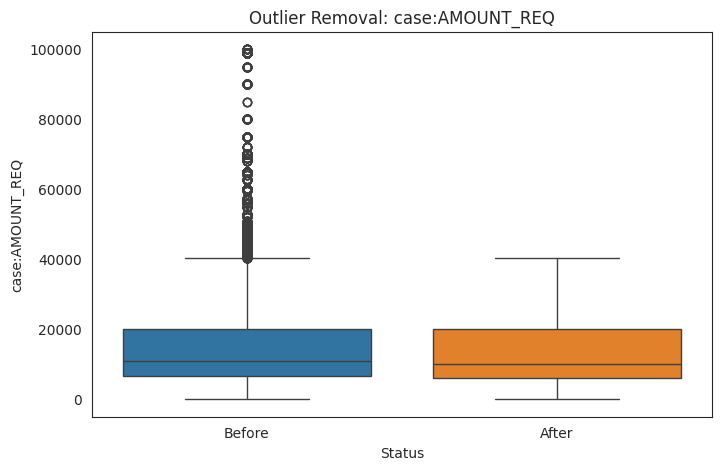

In [18]:
cleaned_event_log = remove_outliers(cleaned_event_log, column="case:AMOUNT_REQ",
                                    plot=True, filepath=os.path.join("figure", "outliers_case_AMOUNT_REQ.png"))

Drop trace with outliers in the duration of the trace. Remove whole cases that are identified as outliers accoring to their duration.

In [19]:
trace_durations = cleaned_event_log.groupby("case:concept:name")["time:timestamp"].agg(lambda x: (x.max() - x.min()).total_seconds())
cleaned_event_log = cleaned_event_log.merge(trace_durations.rename("case:trace_duration"), on="case:concept:name")
print_column_report(cleaned_event_log, 'case:trace_duration', 'Duration of a process request for the trace.')


===== COLUMN REPORT =====
📝 Report for `case:trace_duration` - Duration of a process request for the trace.
-------------------------------------------------------------------------------------
<class 'pandas.core.series.Series'>
RangeIndex: 230848 entries, 0 to 230847
Series name: case:trace_duration
Non-Null Count   Dtype  
--------------   -----  
230848 non-null  float64
dtypes: float64(1)
memory usage: 1.8 MB
None
-------------------------------------------------------------------------------------
count    2.308480e+05
mean     1.543332e+06
std      1.227956e+06
min      1.855000e+00
25%      7.058671e+05
50%      1.306662e+06
75%      2.412140e+06
max      1.185234e+07
Name: case:trace_duration, dtype: float64
-------------------------------------------------------------------------------------



===== OUTLIER DETECTION PROCESS =====
📌 Outliers detected in `case:trace_duration`: 4305
📌 Lower bound: -1853542.10, Upper bound: 4971549.12
✅ Remaining rows after outlier removal: 226543 (from 230848)



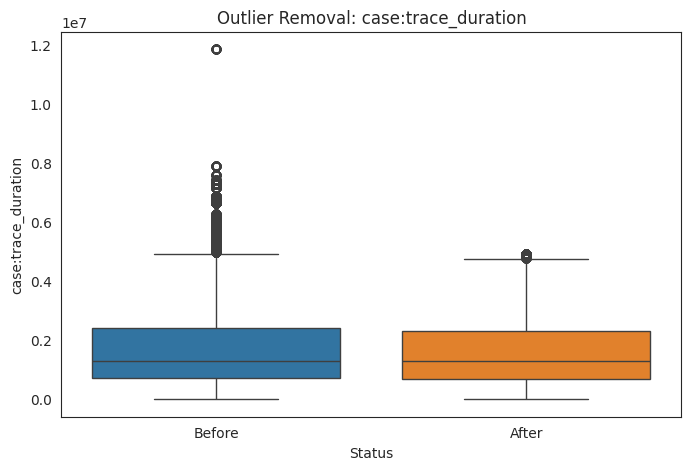

In [20]:
cleaned_event_log = remove_outliers(cleaned_event_log, column="case:trace_duration",
                                    filepath=os.path.join("figure", "outliers_case_trace_duration.png"))

### 3.6 Check *concept:name* vs *lifecycle:transition*

In [21]:
cleaned_event_log.groupby(["concept:name", "lifecycle:transition"]).size().unstack(fill_value=0)

lifecycle:transition,COMPLETE,SCHEDULE,START
concept:name,,,
A_ACCEPTED,4809,0,0
A_ACTIVATED,2149,0,0
A_APPROVED,2149,0,0
A_CANCELLED,2633,0,0
A_DECLINED,7289,0,0
A_FINALIZED,4718,0,0
A_PARTLYSUBMITTED,12442,0,0
A_PREACCEPTED,6903,0,0
A_REGISTERED,2149,0,0


From the above table we can check that there are three different types of events:
* **A_** (State of the application);
* **O_** (State of the offer belonging to the application);
* **W_** (State of the work item belonging to the application).

In addition for each of these events we have different transitions:
* Events of type **A_** and **O_** are just in **COMPLETE** transition;
* Events of type **W_** have three transtitions (**SCHEDULE**, **START**, **COMPLETE**).

Hence, we create three sublog and we work on each of them.



---



## **4 - Application (A_) Event Log**

In [22]:
log_A = cleaned_event_log[cleaned_event_log["concept:name"].str.startswith("A_")]
log_A

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ,case:trace_duration
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546,2011-10-01 00:38:44.546,173688,20000,1072732.480
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880,2011-10-01 00:38:44.546,173688,20000,1072732.480
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906,2011-10-01 00:38:44.546,173688,20000,1072732.480
4,10862,COMPLETE,A_ACCEPTED,2011-10-01 11:42:43.308,2011-10-01 00:38:44.546,173688,20000,1072732.480
6,10862,COMPLETE,A_FINALIZED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000,1072732.480
...,...,...,...,...,...,...,...,...
230833,10933,COMPLETE,A_ACCEPTED,2012-03-01 20:17:22.457,2012-02-29 23:43:09.766,214373,8500,824865.115
230835,10933,COMPLETE,A_FINALIZED,2012-03-01 20:22:38.593,2012-02-29 23:43:09.766,214373,8500,824865.115
230842,112,COMPLETE,A_SUBMITTED,2012-02-29 23:51:16.799,2012-02-29 23:51:16.799,214376,15000,34584.526
230843,112,COMPLETE,A_PARTLYSUBMITTED,2012-02-29 23:51:17.423,2012-02-29 23:51:16.799,214376,15000,34584.526


In [24]:
print(f"📝 Number of unique events: {len(log_A['concept:name'].unique())}")
print(f"🔥 Max number of events in a single trace: {log_A['case:concept:name'].value_counts().max()}")

📝 Number of unique events: 10
🔥 Max number of events in a single trace: 8


Since the number of events in **A_** is 10 and the maximun number of events across the traces in **A_** is 8, we believe that this log does not contain any recurrent behavior.

### 4.1 - Exploratory Data Analysis

#### 4.1.1 Discover *rare* and *dominant* **concept:name**


===== PLOTTING & SAVING: concept:name DISTRIBUTION =====


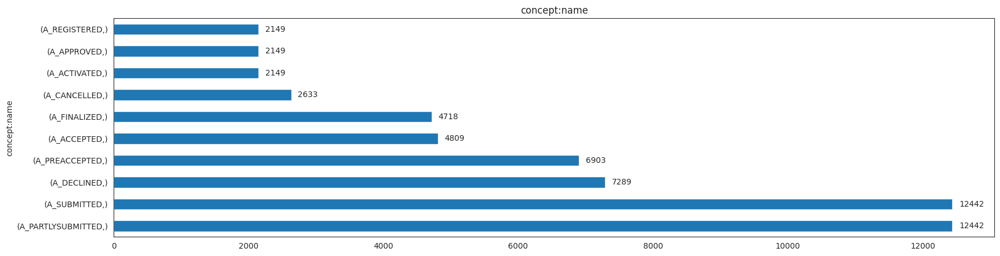

📌 Total items: 57683
⚠️ Low-frequency items (<577 occurrences): 0 items
🔥 High-frequency items (>5768 occurrences): 4 items

🔹 Low-frequency items (examples):
Series([], Name: count, dtype: int64)

🔥 High-frequency items (examples):
concept:name     
A_PARTLYSUBMITTED    12442
A_SUBMITTED          12442
A_DECLINED            7289
A_PREACCEPTED         6903
Name: count, dtype: int64


In [25]:
event_counts = show_values_count_distribution(log=log_A, column="concept:name",
                               figsize=(20, 5), text_offset=100,
                               filepath=os.path.join("figure",
                                                     "log_A_value_counts_concept_name.png"))

# Classify event based on their frequencies
event_classification = classify_counts(count_series=event_counts, total_count=log_A.shape[0])

### 4.2 - Process Discovery

In [27]:
event_log_A = convert_to_event_log(log_A)
overall_metrics = {}

#### 4.2.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


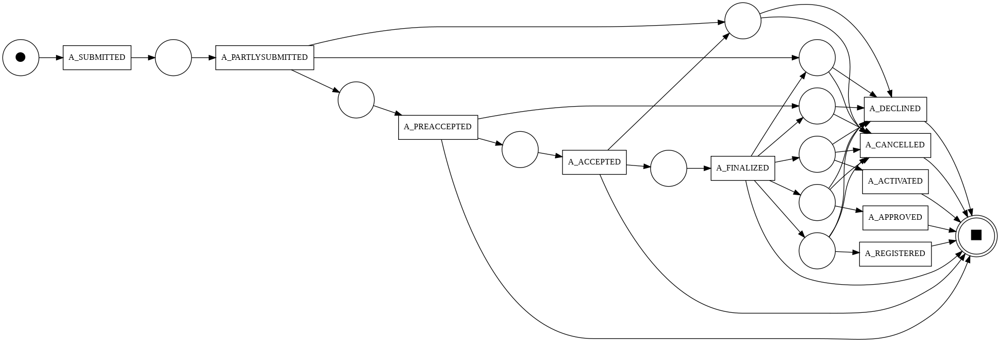


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 12
🔹 Number of transitions: 10
🔹 Number of arcs: 41
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 0, 'average_trace_fitness': 0.7321028359467153, 'log_fitness': 0.7020620118792366, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed traces ::   0%|          | 0/14 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

📈 Generalization: 0.9845138963059077
✨ Simplicity: 0.3666666666666667


In [28]:
net, im, fm = discover_petri_net(event_log_A, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_A_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_A, net, im, fm)

#### 4.2.2 Heuristic Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


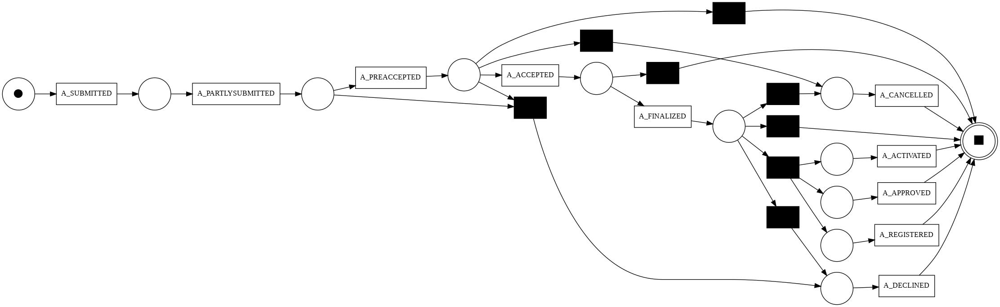


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 12
🔹 Number of transitions: 18
🔹 Number of arcs: 39
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 29.50490274875422, 'average_trace_fitness': 0.7922037909580117, 'log_fitness': 0.8041448650439318, 'percentage_of_fitting_traces': 29.50490274875422}


computing precision with alignments, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

📈 Generalization: 0.8871348951196839
✨ Simplicity: 0.625


In [29]:
net, im, fm = discover_petri_net(event_log_A, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_A_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_A, net, im, fm)

#### 4.2.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


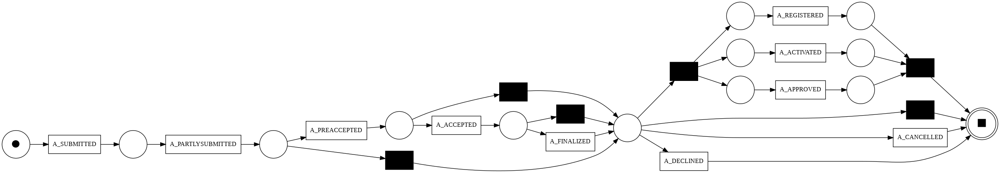


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 13
🔹 Number of transitions: 16
🔹 Number of arcs: 36
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9999849908238017, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

🎯 Precision: 0.6348768472906403


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

📈 Generalization: 0.9756225280883029
✨ Simplicity: 0.6744186046511628


In [30]:
net, im, fm = discover_petri_net(event_log_A, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_A_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_A, net, im, fm)

#### 4.2.4 Summary and Comparison

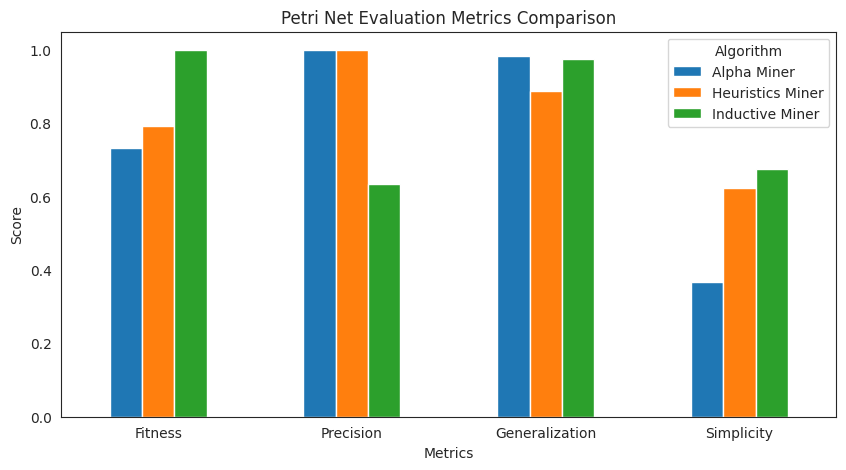

In [31]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_A_overall_metrics.png"))

### 4.3 - LLM Integration for Textual Abstractions & Report Generation

#### 4.3.1 Compares abstract_case() output with actual trace data

In [32]:
validate_case_abstraction(event_log_A, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - A_SUBMITTED; 2011-10-01 08:08:58.256000; COMPLETE; 112
    - A_PARTLYSUBMITTED; 2011-10-01 08:09:02.195000; COMPLETE; 112
    - A_PREACCEPTED; 2011-10-01 08:09:56.648000; COMPLETE; 112
    - A_ACCEPTED; 2011-10-01 14:33:54.614000; COMPLETE; 10862
    - A_FINALIZED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - A_APPROVED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_REGISTERED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_ACTIVATED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
-------------------------------------------------------------------------------------

🔍 Generated Case Summary:

If I have a case with the following (case) attributes:

REG_DATE = 2011-10-01 08:08:58.256000
concept:name = 173691
AMOUNT_REQ = 5000
trace_duration = 799716.377


the case contains the following events (the activity of the event is reported first):

A_SUBMITTED ( timestamp = 2011-10-01 08:08:58.256000 ;  lifecycle:transition = 

#### 4.3.2 Checks abstract_variants() output against real process variants

In [33]:
validate_variants_abstraction(event_log_A)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 17
                                                                                                        Variant  Occurrences
                                                                   (A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINED)         5538
                          (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_ACCEPTED, A_FINALIZED, A_CANCELLED)         1534
                                                   (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_CANCELLED)         1037
                                                    (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_DECLINED)          995
                           (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_ACCEPTED, A_FINALIZED, A_DECLINED)          729
(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_ACCEPTED, A_FINALIZED, A_APPROVED, A_REGISTERED, A_ACTIVATED)          568
(A_SUBMITTED, A_PARTLYSUBM

#### 4.3.3 Ensures abstract_log_attributes() matches real log attributes

In [34]:
validate_log_attributes_abstraction(event_log_A)


📊 Log Attributes Validation:
🔹 Number of unique activities: 10
🔹 Most frequent activities:
 concept:name
A_PARTLYSUBMITTED    12442
A_SUBMITTED          12442
A_DECLINED            7289
A_PREACCEPTED         6903
A_ACCEPTED            4809
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-09 13:26:10.800999936'), 0.5: Timestamp('2011-12-16 12:12:11.675000064'), 0.75: Timestamp('2012-01-25 18:56:55.719000064'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}
case:trace_duration  empty: 0  quantiles: {0.0: 1.855, 0.25: 3615.957, 0.5: 779192.539, 0.75: 1550576.571, 1.0: 4928049.989}
concept:name  empty: 0 values: (A_SUBMITTED; freq. 12442) (A_PARTLYSUBMITTED; freq. 12442) (

#### 4.3.4 Compares abstract_petri_net() output with real Petri net structure

In [35]:
validate_petri_net_abstraction(net, im, fm) #INDUCTIVE NET


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_12', 'p_3', 'p_13', 'p_11', 'p_5', 'p_9', 'p_6', 'p_7', 'p_10', 'source', 'sink', 'p_8', 'p_4'}
🔹 Petri Net Transitions: {'A_REGISTERED', 'A_APPROVED', 'A_PREACCEPTED', 'A_ACTIVATED', 'A_SUBMITTED', 'A_PARTLYSUBMITTED', 'A_FINALIZED', 'A_DECLINED', 'A_ACCEPTED', 'A_CANCELLED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_3, p_4, p_5, p_6, p_7, p_8, p_9, sink, source ]
transitions: [ (226a1ea1-b99f-47be-bf35-e98ef9b3667e, 'A_PARTLYSUBMITTED'), (305413f5-04de-4abe-9dfd-bc92148f6fff, 'A_REGISTERED'), (36a148e3-7b1a-46c1-8ee8-a58414c11421, 'A_APPROVED'), (3d9b3bce-c654-4565-a472-a13f22f0a2be, 'A_ACTIVATED'), (5f002f9f-2da3-44b3-a43a-102d12241950, 'A_ACCEPTED'), (609b5d91-5b97-4d4b-8707-23a9aad0b678, 'A_FINALIZED'), (6dafe2f3-0c67-4be0-b32e-3b76c59290a3, 'A_DECLINED'), (857b9bd1-1cc1-4d8d-a82d-6c13e6a79319, 'A_CANCELLED'), (c27aa17c-1bed-409e-a24f-9f7b108a8ab7, 'A_PREACCEPTED'), (e6207037-ef2b-

#### 4.3.5 Petri Net Evaluation using Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [36]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_A_petri_net_alpha.png"))

The Petri net depicts a process with several potential issues. Let's break down the analysis:

**Process Flow Description:**

The process begins with a submission (`A_SUBMITTED`).  It can be either fully submitted or partially submitted (`A_PARTLYSUBMITTED`). A partially submitted application transitions to `A_PREACCEPTED` after some processing.  Fully submitted and pre-accepted applications proceed to `A_ACCEPTED`.  Once accepted, the application is finalized (`A_FINALIZED`).  From the `A_FINALIZED` state, the application can transition to several final states: `A_DECLINED`, `A_CANCELLED`, `A_ACTIVATED`, `A_APPROVED`, or `A_REGISTERED`.  There appear to be multiple paths and decision points influencing the final state.  The transitions between `A_FINALIZED` and the final states are not clearly defined based on the provided diagram (lack of labels on arcs).

**Deadlocks and Livelocks:**

There are no apparent deadlocks (states where the process cannot progress) in this Petri net.  Howe

##### Heuristic Miner Evaluation

In [38]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_A_petri_net_heuristics.png"))

This Petri net represents a process with several potential issues. Let's break down the analysis:

**Process Flow Description:**

The process begins with a submission ("A_SUBMITTED").  The submission can be complete or partial ("A_PARTLYSUBMITTED").  A partially submitted application moves to "A_PREACCEPTED" state.  A fully submitted application also reaches "A_PREACCEPTED". From "A_PREACCEPTED", the application can be accepted ("A_ACCEPTED"), leading to finalization ("A_FINALIZED"). After finalization, the process can end. However, several other transitions exist, indicative of different possible outcomes and rework loops:

* **Cancellation:** At multiple points (after submission, pre-acceptance, and acceptance), the application can be cancelled ("A_CANCELLED").
* **Approval/Activation/Registration:** Following finalization, the application is approved ("A_APPROVED"), activated ("A_ACTIVATED"), and registered ("A_REGISTERED"). There also exists a possibility to be declined ("A_DECLINE

##### Inductive Miner Evaluation

In [62]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_A_petri_net_inductive.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 708.95ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 633.18ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 658.92ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 632.88ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 606.90ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 607.00ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.07ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generat

The Petri net depicts a process with several potential issues. Let's break down the process flow, identify problems, and propose improvements.

**Process Flow Description:**

The process begins with an application being submitted (`A_SUBMITTED`).  It can either be fully submitted or partially submitted (`A_PARTLYSUBMITTED`).  A partially submitted application proceeds to `A_PREACCEPTED`, then to `A_ACCEPTED`, followed by a further approval stage resulting in either `A_APPROVED` or `A_DECLINED`. Fully submitted applications directly go to `A_PREACCEPTED`.  Regardless of whether an application is fully or partially submitted the applications then converge. From `A_APPROVED` the application moves to `A_FINALIZED`.  At any point, an application can be cancelled (`A_CANCELLED`).  `A_REGISTERED` and `A_ACTIVATED` seem to be intermediate states unrelated to the core application process flow and need further clarification.  There appears to be a convergence point feeding into multiple states.


#### 4.3.6 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [44]:
print(summarize_metrics(api_key, "gemini-1.5-pro", overall_metrics))

## Process Mining Algorithm Comparison Report

This report analyzes the performance of three process mining algorithms – Alpha Miner, Heuristics Miner, and Inductive Miner – based on the provided metrics: Fitness, Precision, Generalization, and Simplicity.  Each metric contributes to understanding the discovered model's quality and its applicability to real-world scenarios.

**Metrics Explained:**

* **Fitness:** Measures how well the discovered model represents the observed behavior in the event log (0-1, higher is better).  A perfect fitness (1.0) indicates the model can reproduce every trace in the log.
* **Precision:** Represents the proportion of behavior in the discovered model that is also present in the event log (0-1, higher is better). A perfect precision (1.0) means the model doesn't include any behavior not seen in the log.
* **Generalization:** Indicates the model's ability to predict future behavior based on the observed log (0-1, higher is better).  High generalization s



---



## **5 - Offer (O_) Event Log**

In [23]:
log_O = cleaned_event_log[cleaned_event_log["concept:name"].str.startswith("O_")]
log_O

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ,case:trace_duration
5,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000,1072732.480
7,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197,2011-10-01 00:38:44.546,173688,20000,1072732.480
8,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380,2011-10-01 00:38:44.546,173688,20000,1072732.480
12,11049,COMPLETE,O_SENT_BACK,2011-10-10 11:33:03.668,2011-10-01 00:38:44.546,173688,20000,1072732.480
18,10629,COMPLETE,O_ACCEPTED,2011-10-13 10:37:29.226,2011-10-01 00:38:44.546,173688,20000,1072732.480
...,...,...,...,...,...,...,...,...
230805,11003,COMPLETE,O_SENT,2012-03-02 10:14:43.303,2012-02-29 23:22:24.570,214364,5000,733163.786
230813,10789,COMPLETE,O_SENT_BACK,2012-03-09 11:01:46.008,2012-02-29 23:22:24.570,214364,5000,733163.786
230834,10933,COMPLETE,O_SELECTED,2012-03-01 20:22:38.593,2012-02-29 23:43:09.766,214373,8500,824865.115
230836,10933,COMPLETE,O_CREATED,2012-03-01 20:22:40.016,2012-02-29 23:43:09.766,214373,8500,824865.115


In [27]:
print(f"📝 Number of unique events: {len(log_O['concept:name'].unique())}")
print(f"🔥 Max number of events in a single trace: {log_O['case:concept:name'].value_counts().max()}")

📝 Number of unique events: 7
🔥 Max number of events in a single trace: 30


Since the number of events in **O_** is 7 and the maximun number of events across the traces in **O_** is 30, we believe that this log contains recurrent behavior.

### 5.1 - Exploratory Data Analysis

#### 5.1.1 Discover *rare* and *dominant* **concept:name**


===== PLOTTING & SAVING: concept:name DISTRIBUTION =====


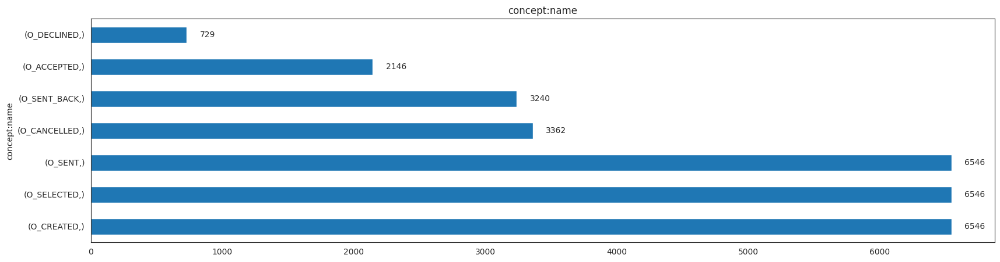

📌 Total items: 29115
⚠️ Low-frequency items (<291 occurrences): 0 items
🔥 High-frequency items (>2912 occurrences): 5 items

🔹 Low-frequency items (examples):
Series([], Name: count, dtype: int64)

🔥 High-frequency items (examples):
concept:name
O_CREATED       6546
O_SELECTED      6546
O_SENT          6546
O_CANCELLED     3362
O_SENT_BACK     3240
Name: count, dtype: int64


In [28]:
event_counts = show_values_count_distribution(log=log_O, column="concept:name",
                               figsize=(20, 5), text_offset=100,
                               filepath=os.path.join("figure", "log_O_value_counts_concept_name.png"))

# Classify event based on their frequencies
event_classification = classify_counts(count_series=event_counts, total_count=log_O.shape[0])

### 5.2 - Process Discovery

In [49]:
event_log_O = convert_to_event_log(log_O)
overall_metrics = {}

#### 5.2.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


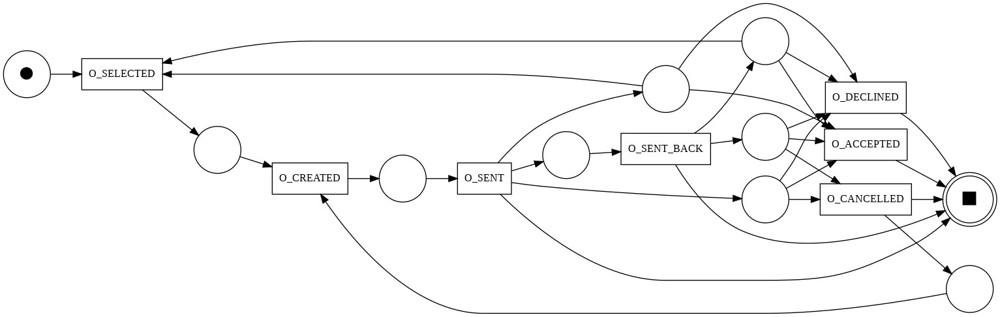


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 10
🔹 Number of transitions: 7
🔹 Number of arcs: 30
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 0, 'average_trace_fitness': 0.6891848689589762, 'log_fitness': 0.6948057063193096, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed traces ::   0%|          | 0/389 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

📈 Generalization: 0.9813545935431564
✨ Simplicity: 0.39534883720930236


In [50]:
net, im, fm = discover_petri_net(event_log_O, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_O_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_O, net, im, fm)

#### 5.2.2 Heuristic Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


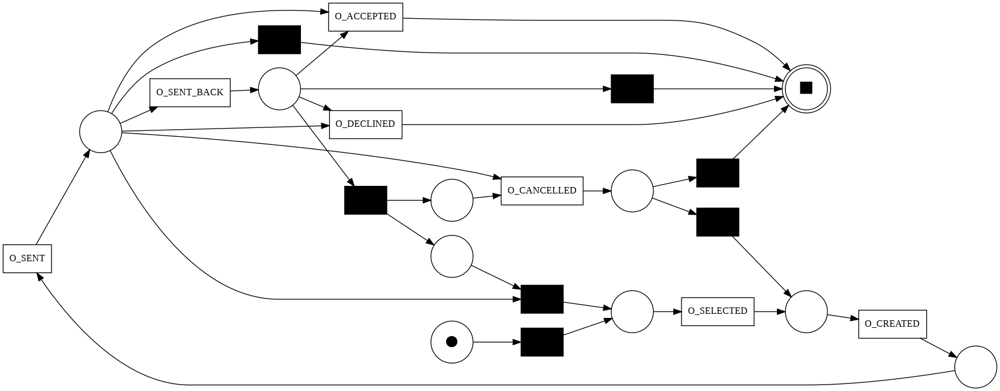


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 10
🔹 Number of transitions: 14
🔹 Number of arcs: 33
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/158 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 4.196693514200932, 'average_trace_fitness': 0.7779095759595624, 'log_fitness': 0.7250067226803596, 'percentage_of_fitting_traces': 4.196693514200932}


computing precision with alignments, completed variants ::   0%|          | 0/389 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

📈 Generalization: 0.8737984215396573
✨ Simplicity: 0.5714285714285714


In [51]:
net, im, fm = discover_petri_net(event_log_O, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_O_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_O, net, im, fm)

#### 5.2.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


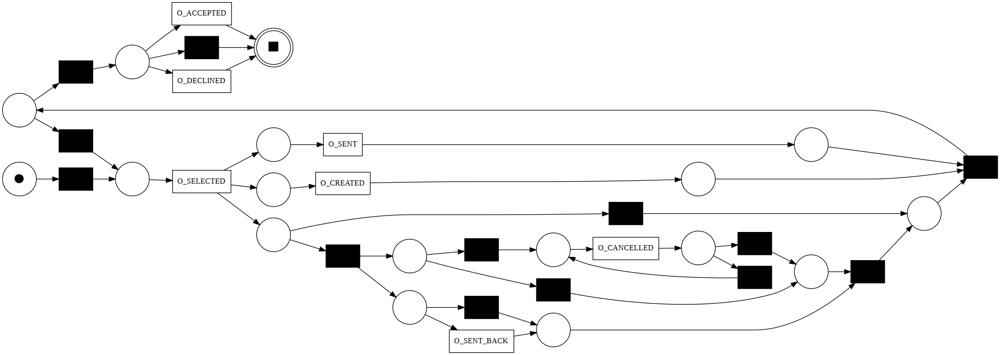


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 17
🔹 Number of transitions: 20
🔹 Number of arcs: 46
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/158 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9999000146956327, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/389 [00:00<?, ?it/s]

🎯 Precision: 0.5529495242075797


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

📈 Generalization: 0.979403271673825
✨ Simplicity: 0.6727272727272727


In [52]:
net, im, fm = discover_petri_net(event_log_O, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_O_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_O, net, im, fm)

#### 5.2.4 Summary and Comparison

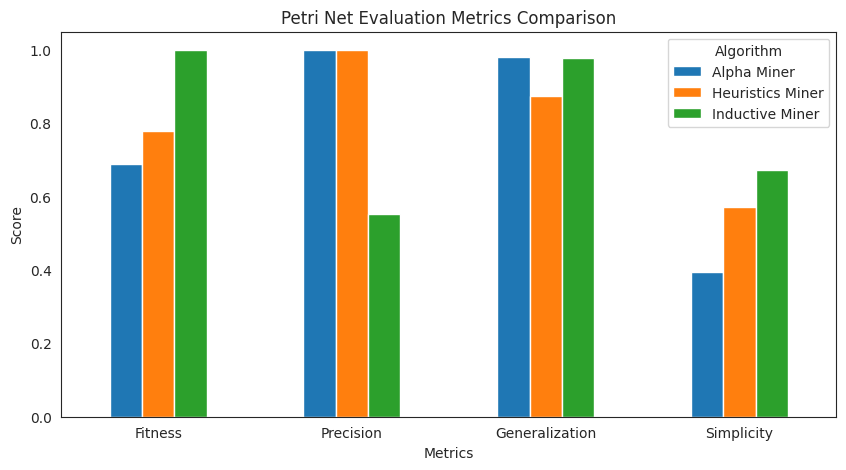

In [53]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_O_overall_metrics.png"))

### 5.3 - LLM Integration for Textual Abstractions & Report Generation

#### 5.3.1 Compares abstract_case() output with actual trace data

In [54]:
validate_case_abstraction(event_log_O, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - O_SELECTED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - O_CREATED; 2011-10-01 14:35:47.488000; COMPLETE; 10862
    - O_SENT; 2011-10-01 14:35:47.583000; COMPLETE; 10862
    - O_SELECTED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CANCELLED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CREATED; 2011-10-03 16:56:19.613000; COMPLETE; 11120
    - O_SENT; 2011-10-03 16:56:19.645000; COMPLETE; 11120
    - O_SENT_BACK; 2011-10-10 10:14:43.775000; COMPLETE; 11049
    - O_ACCEPTED; 2011-10-10 14:17:26.306000; COMPLETE; 10809
-------------------------------------------------------------------------------------

🔍 Generated Case Summary:

If I have a case with the following (case) attributes:

REG_DATE = 2011-10-01 08:08:58.256000
concept:name = 173691
AMOUNT_REQ = 5000
trace_duration = 799716.377


the case contains the following events (the activity of the event is reported first):

O_SELECTED ( timestamp = 2011-10-0

#### 5.3.2 Checks abstract_variants() output against real process variants

In [55]:
validate_variants_abstraction(event_log_O)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 158
                                                                                                                                                                                                                                                                                                                                      Variant  Occurrences
                                                                                                                                                                                                                                                                                     (O_SELECTED, O_CREATED, O_SENT, O_SENT_BACK, O_ACCEPTED)         1484
                                                                                                                                                                                                              

#### 5.3.3 Ensures abstract_log_attributes() matches real log attributes

In [56]:
validate_log_attributes_abstraction(event_log_O)


📊 Log Attributes Validation:
🔹 Number of unique activities: 7
🔹 Most frequent activities:
 concept:name
O_CREATED      6546
O_SELECTED     6546
O_SENT         6546
O_CANCELLED    3362
O_SENT_BACK    3240
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-08 18:35:47.257999872'), 0.5: Timestamp('2011-12-21 10:51:26.761999872'), 0.75: Timestamp('2012-01-25 20:24:22.704000'), 1.0: Timestamp('2012-02-29 23:43:09.766000128')}
case:trace_duration  empty: 0  quantiles: {0.0: 507.914, 0.25: 947928.962, 0.5: 1386471.477, 0.75: 2202116.865, 1.0: 4928049.989}
concept:name  empty: 0 values: (O_SENT; freq. 6546) (O_SELECTED; freq. 6546) (O_CREATED; freq. 6546) (O_CANCELLED; freq. 3362)

#### 5.3.4 Compares abstract_petri_net() output with real Petri net structure

In [57]:
validate_petri_net_abstraction(net, im, fm)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_19', 'p_12', 'p_13', 'p_11', 'p_14', 'p_5', 'p_10', 'p_6', 'p_16', 'p_9', 'p_15', 'sink', 'source', 'p_18', 'p_17', 'p_8', 'p_4'}
🔹 Petri Net Transitions: {'O_SELECTED', 'O_ACCEPTED', 'O_CANCELLED', 'O_CREATED', 'O_SENT_BACK', 'O_DECLINED', 'O_SENT'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_14, p_15, p_16, p_17, p_18, p_19, p_4, p_5, p_6, p_8, p_9, sink, source ]
transitions: [ (0460dd56-47e4-4188-9bab-571a622816a3, 'O_SENT'), (0e278edb-3195-4f59-8a98-fb1611c4a24c, 'O_ACCEPTED'), (52871fc0-654c-4aef-ac7f-2e97f5cddb82, 'O_CANCELLED'), (65b76981-a56c-4760-bcf4-dc909dcd1003, 'O_CREATED'), (7ab189c7-dff8-4479-8b48-2fa85252b004, 'O_DECLINED'), (858bba18-c571-4ecf-82de-d5dd2cebe0ed, 'O_SENT_BACK'), (d92eaccc-4f74-4a51-ba8b-ebcc619e3a42, 'O_SELECTED'), (init_loop_11, None), (skip_10, None), (skip_13, None), (skip_14, None), (skip_15, None), (skip_16, None), (skip_17, None), (skip_6, None), (s

#### 5.3.5 Petri Net Evaluation using Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [58]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_O_petri_net_alpha.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 908.46ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 656.13ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 632.79ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.93ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 630.73ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.58ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.32ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generat

The Petri net depicts an order processing system. Let's break down the process flow, identify potential issues, and suggest improvements.

**Process Flow:**

1. **Order Selection (O_SELECTED):** The process starts with an order being selected (represented by the transition O_SELECTED).  This transition fires when an order is ready for processing.

2. **Order Creation (O_CREATED):** After selection, the order is created (transition O_CREATED).  This step likely involves data entry and validation.

3. **Order Sent (O_SENT):** Once created, the order is sent (transition O_SENT) for further processing or delivery.

4. **Order Sent Back (O_SENT_BACK):** The order might be sent back (transition O_SENT_BACK) for various reasons (e.g., corrections, missing information). This indicates a feedback loop.

5. **Order Acceptance/Decline/Cancellation:** After sending, three possibilities emerge:
    * **O_ACCEPTED:** The order is accepted.
    * **O_DECLINED:** The order is declined (e.g., due to st

##### Heuristic Miner Evaluation

In [59]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_O_petri_net_heuristics.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 707.81ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 607.40ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 606.80ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.23ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.80ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 632.95ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 607.25ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generat

This Petri net models an order processing system. Let's break down the process flow, identify potential issues, and suggest improvements.

**Process Flow:**

1. **Order Sent (O_SENT):** The process begins with an order being sent.
2. **Order Handling:** The order then branches into several possible paths:
    * **Order Accepted (O_ACCEPTED):** The order is accepted and proceeds to the final step.
    * **Order Declined (O_DECLINED):** The order is declined and ends there.
    * **Order Sent Back (O_SENT_BACK):** The order is sent back (likely for correction or further information) and returns to the beginning of the process.
    * **Order Cancelled (O_CANCELLED):** The order is canceled at some stage.
    * **Order Selected (O_SELECTED):**  The order moves through the selection process and will later transition to a created state.

3. **Order Creation (O_CREATED):** The Order is created and will move to the end state.
4. **Order Completion:**  All successful paths (O_ACCEPTED and O_CRE

##### Inductive Miner Evaluation

In [60]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_O_petri_net_inductive.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 706.89ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 632.08ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 632.46ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 633.20ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 631.03ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 732.72ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 657.56ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generat

This Petri net represents a process, likely an order management system.  Let's analyze it step-by-step:

**Process Flow Description:**

The process begins at the leftmost place (a circle representing a state).  An order is initiated, moving to a "black square" (transition representing an activity). This transition likely represents the order being received or entered into the system.  The order then moves to a decision point (the split in the flow).  The order is either accepted or declined.

* **Accepted Path:** If accepted, it proceeds through several transitions (activities) representing order selection, creation, sending, and final completion.  There are multiple places involved in this path likely representing different stages or queues within the process.

* **Declined Path:** If declined, the process terminates at the top-right place representing an order declined status.

* **Cancellation Path:** At various points along the accepted path, orders can be canceled, diverting to a 

#### 5.3.6 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [61]:
print(summarize_metrics(api_key, "gemini-pro", overall_metrics))

**Comparative Report on Process Mining Algorithms**

**Introduction**

Process mining algorithms play a crucial role in extracting knowledge from event logs, enabling organizations to gain insights into their processes, identify inefficiencies, and make improvements. This report provides a detailed comparison of three prominent process mining algorithms: Alpha Miner, Heuristics Miner, and Inductive Miner.

**Metrics**

The algorithms are evaluated based on four key metrics:

* **Fitness:** Measures the accuracy of the discovered process model.
* **Precision:** Indicates the proportion of discovered edges that are correct.
* **Generalization:** Captures the ability of the model to generalize to unseen event logs.
* **Simplicity:** Assesses the complexity of the discovered process model.

**Algorithm Analysis**

**Alpha Miner**

* **Strengths:** High precision (1.0) indicates that all discovered edges are correct.
* **Weaknesses:** Lower fitness (0.6891) and generalization (0.9813) sugge



---



## **6 - Work (W_) Event Log**

In [29]:
log_W = cleaned_event_log[cleaned_event_log["concept:name"].str.startswith("W_")]
log_W

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ,case:trace_duration
3,112,SCHEDULE,W_Completeren aanvraag,2011-10-01 00:39:38.875,2011-10-01 00:38:44.546,173688,20000,1072732.480
9,10913,START,W_Nabellen offertes,2011-10-08 16:26:57.720,2011-10-01 00:38:44.546,173688,20000,1072732.480
10,10913,COMPLETE,W_Nabellen offertes,2011-10-08 16:32:00.886,2011-10-01 00:38:44.546,173688,20000,1072732.480
11,11049,START,W_Nabellen offertes,2011-10-10 11:32:22.495,2011-10-01 00:38:44.546,173688,20000,1072732.480
13,11049,SCHEDULE,W_Valideren aanvraag,2011-10-10 11:33:04.560,2011-10-01 00:38:44.546,173688,20000,1072732.480
...,...,...,...,...,...,...,...,...
230840,11119,START,W_Nabellen offertes,2012-03-10 12:46:22.700,2012-02-29 23:43:09.766,214373,8500,824865.115
230841,11119,COMPLETE,W_Nabellen offertes,2012-03-10 12:50:54.881,2012-02-29 23:43:09.766,214373,8500,824865.115
230844,112,SCHEDULE,W_Afhandelen leads,2012-02-29 23:52:01.287,2012-02-29 23:51:16.799,214376,15000,34584.526
230845,11169,START,W_Afhandelen leads,2012-03-01 09:26:46.736,2012-02-29 23:51:16.799,214376,15000,34584.526


In [30]:
print(f"📝 Number of unique events: {len(log_W['concept:name'].unique())}")
print(f"🔥 Max number of events in a single trace: {log_W['case:concept:name'].value_counts().max()}")

📝 Number of unique events: 7
🔥 Max number of events in a single trace: 150


Since the number of events in **W_** is 7 and the maximun number of events across the traces in **W_** is 150, we believe that this log contains recurrent behavior.

### 6.1 - Exploratory Data Analysis

#### 6.1.1 Discover *rare* and *dominant* **concept:name**


===== PLOTTING & SAVING: concept:name DISTRIBUTION =====


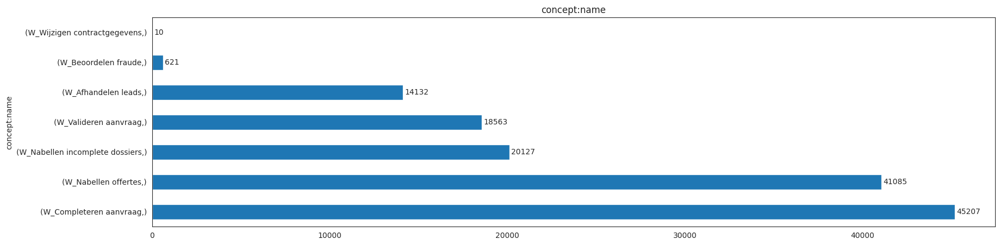

📌 Total items: 139745
⚠️ Low-frequency items (<1397 occurrences): 2 items
🔥 High-frequency items (>13974 occurrences): 5 items

🔹 Low-frequency items (examples):
concept:name               
W_Beoordelen fraude            621
W_Wijzigen contractgegevens     10
Name: count, dtype: int64

🔥 High-frequency items (examples):
concept:name                  
W_Completeren aanvraag            45207
W_Nabellen offertes               41085
W_Nabellen incomplete dossiers    20127
W_Valideren aanvraag              18563
W_Afhandelen leads                14132
Name: count, dtype: int64


In [31]:
event_counts = show_values_count_distribution(log=log_W, column="concept:name",
                               figsize=(20, 5), text_offset=100,
                               filepath=os.path.join("figure", "log_W_value_counts_concept_name.png"))

# Classify event based on their frequencies
event_classification = classify_counts(count_series=event_counts, total_count=log_W.shape[0])

In [32]:
event_log_W = filter_rare_events(log_W, event_classification['low_frequency'])


===== FILTERING RARE EVENTS =====
📌 Total events before filtering: 139745
⚠️ Rare events removed: 631
✅ Total events after filtering: 139114


#### 6.1.3 Analyzed **lifecycle:transition** and inconsistency


===== PLOTTING & SAVING: lifecycle:transition DISTRIBUTION =====


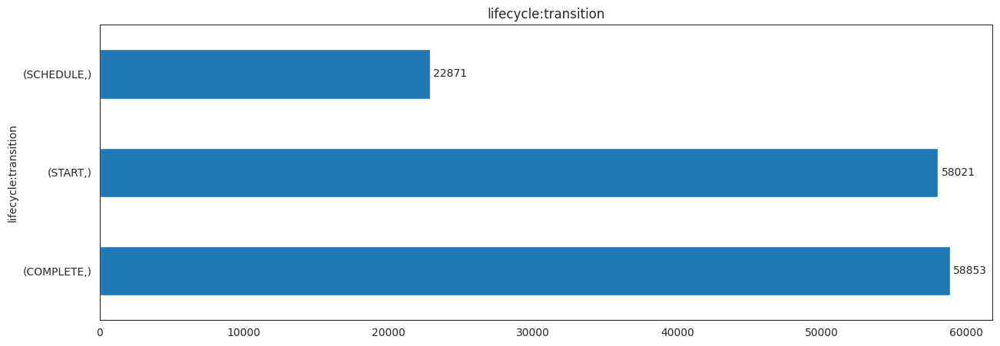

In [33]:
event_counts = show_values_count_distribution(log=log_W, column="lifecycle:transition",
                               figsize=(15, 5), text_offset=250,
                               filepath=os.path.join("figure", "log_W_value_counts_lifecycle_transition.png"))

### 6.2 - Process Discovery

In [68]:
#event_log_W = event_log_W[event_log_W["lifecycle:transition"]=="SCHEDULE"]
event_log_W = convert_to_event_log(log_W)
overall_metrics = {}

#### 6.2.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


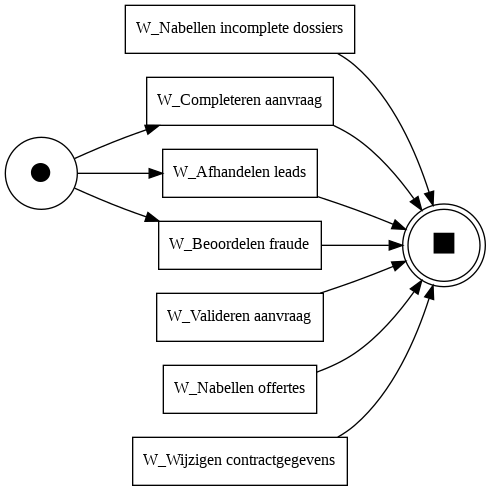


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 2
🔹 Number of transitions: 7
🔹 Number of arcs: 10
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? False
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/2696 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 4.13060151199737, 'average_trace_fitness': 0.25377052609178263, 'log_fitness': 0.12261540114998115, 'percentage_of_fitting_traces': 4.13060151199737}


computing precision with alignments, completed variants ::   0%|          | 0/23903 [00:00<?, ?it/s]

🎯 Precision: 0.4783496766647738


replaying log with TBR, completed traces ::   0%|          | 0/2696 [00:00<?, ?it/s]

📈 Generalization: 0.9444580681850179
✨ Simplicity: 0.8181818181818181


In [69]:
net, im, fm = discover_petri_net(event_log_W, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_W_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_W, net, im, fm)

#### 6.2.2 Heuristic Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


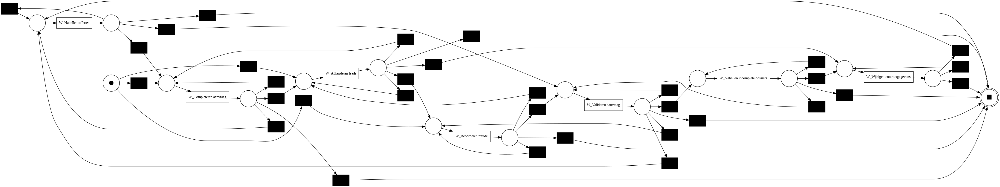


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 16
🔹 Number of transitions: 39
🔹 Number of arcs: 78
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/2696 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 97.80869946313136, 'average_trace_fitness': 0.9980265909468067, 'log_fitness': 0.9985297321445735, 'percentage_of_fitting_traces': 97.80869946313136}


computing precision with alignments, completed variants ::   0%|          | 0/23903 [00:00<?, ?it/s]

🎯 Precision: 0.5612634841008024


replaying log with TBR, completed traces ::   0%|          | 0/2696 [00:00<?, ?it/s]

📈 Generalization: 0.8477231561781363
✨ Simplicity: 0.5445544554455445


In [70]:
net, im, fm = discover_petri_net(event_log_W, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_W_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_W, net, im, fm)

#### 6.2.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


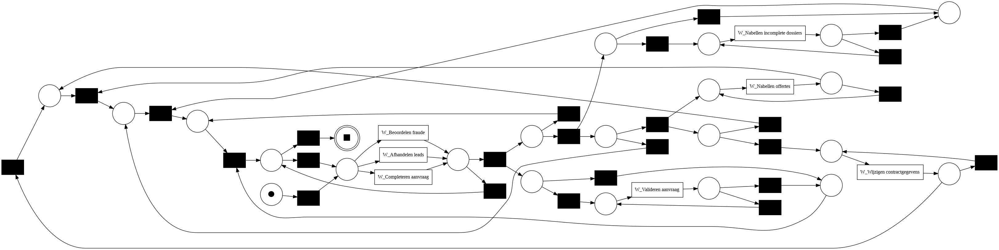


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 23
🔹 Number of transitions: 32
🔹 Number of arcs: 70
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/2696 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9998187442655189, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/23903 [00:00<?, ?it/s]

🎯 Precision: 0.29232102333968


replaying log with TBR, completed traces ::   0%|          | 0/2696 [00:00<?, ?it/s]

📈 Generalization: 0.9318745399193243
✨ Simplicity: 0.6470588235294118


In [71]:
net, im, fm = discover_petri_net(event_log_W, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_W_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_W, net, im, fm)

#### 6.2.4 Summary and Comparison

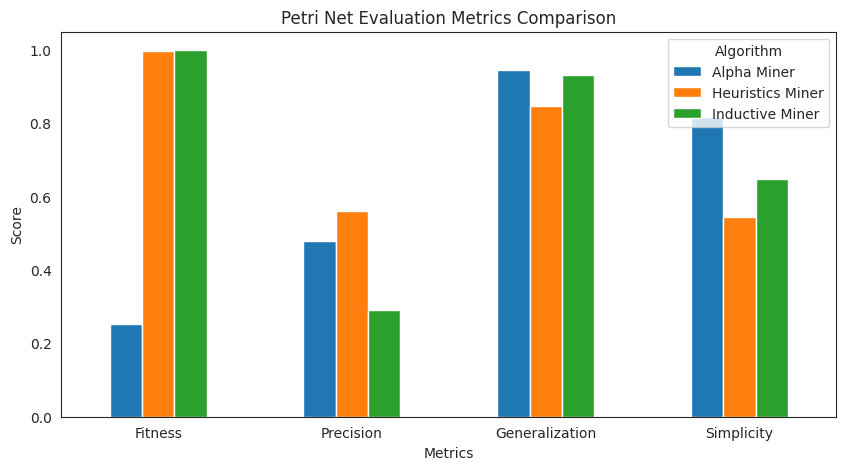

In [72]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_W_overall_metrics.png"))

### 6.3 - LLM Integration for Textual Abstractions & Report Generation

#### 6.3.1 Compares abstract_case() output with actual trace data

In [73]:
validate_case_abstraction(event_log_W, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - W_Completeren aanvraag; 2011-10-01 08:09:59.578000; SCHEDULE; 112
    - W_Nabellen offertes; 2011-10-10 10:13:44.827000; START; 11049
    - W_Valideren aanvraag; 2011-10-10 10:14:44.052000; SCHEDULE; 11049
    - W_Nabellen offertes; 2011-10-10 10:14:45.514000; COMPLETE; 11049
    - W_Valideren aanvraag; 2011-10-10 11:12:36.612000; START; 10809
    - W_Valideren aanvraag; 2011-10-10 11:30:54.893000; COMPLETE; 10809
    - W_Valideren aanvraag; 2011-10-10 14:11:42.124000; START; 10809
    - W_Valideren aanvraag; 2011-10-10 14:14:13.394000; COMPLETE; 10809
    - W_Valideren aanvraag; 2011-10-10 14:14:52.842000; START; 10809
    - W_Valideren aanvraag; 2011-10-10 14:17:34.633000; COMPLETE; 10809
-------------------------------------------------------------------------------------

🔍 Generated Case Summary:

If I have a case with the following (case) attributes:

REG_DATE = 2011-10-01 08:08:58.256000
concept:name = 173691
AMOUNT_REQ = 

#### 6.3.2 Checks abstract_variants() output against real process variants

In [74]:
validate_variants_abstraction(event_log_W)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 2696
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

#### 6.3.3 Ensures abstract_log_attributes() matches real log attributes

In [75]:
validate_log_attributes_abstraction(event_log_W)


📊 Log Attributes Validation:
🔹 Number of unique activities: 7
🔹 Most frequent activities:
 concept:name
W_Completeren aanvraag            45207
W_Nabellen offertes               41085
W_Nabellen incomplete dossiers    20127
W_Valideren aanvraag              18563
W_Afhandelen leads                14132
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-13 16:59:55.444000'), 0.5: Timestamp('2011-12-27 11:05:18.688000'), 0.75: Timestamp('2012-01-28 17:43:17.313999872'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}
case:trace_duration  empty: 0  quantiles: {0.0: 66.618, 0.25: 852780.669, 0.5: 1465019.408, 0.75: 2592947.718, 1.0: 4928049.989}
concept:name  empty: 0 values:

#### 6.3.4 Compares abstract_petri_net() output with real Petri net structure

In [76]:
validate_petri_net_abstraction(net, im, fm)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_20', 'p_13', 'p_21', 'p_10', 'p_16', 'p_7', 'p_14', 'p_9', 'p_6', 'source', 'sink', 'p_8', 'p_11', 'p_5', 'p_15', 'p_29', 'p_18', 'p_17', 'p_23', 'p_25', 'p_24', 'p_30', 'p_22'}
🔹 Petri Net Transitions: {'W_Nabellen incomplete dossiers', 'W_Valideren aanvraag', 'W_Completeren aanvraag', 'W_Nabellen offertes', 'W_Afhandelen leads', 'W_Wijzigen contractgegevens', 'W_Beoordelen fraude'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_13, p_14, p_15, p_16, p_17, p_18, p_20, p_21, p_22, p_23, p_24, p_25, p_29, p_30, p_5, p_6, p_7, p_8, p_9, sink, source ]
transitions: [ (116ccd04-266f-4627-9989-610583bfd605, 'W_Beoordelen fraude'), (15c27149-9747-40f6-8376-2d675180d469, 'W_Afhandelen leads'), (70ec7232-408f-4bb4-8e9b-d317544a2052, 'W_Completeren aanvraag'), (77c7db0a-180d-4e5e-bb83-5d8d3afa5b66, 'W_Nabellen offertes'), (b02e7c8d-4e8d-43ec-84da-4433e6672cbc, 'W_Nabellen incomplete dossiers'), (b4fb802e-ce3b-44

#### 6.3.5 Petri Net Evaluation using Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [78]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_W_petri_net_alpha.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 1157.55ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 604.95ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 579.48ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 579.41ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 604.51ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 655.86ms


This Petri net depicts a process with a single start place and a single end place.  The activities represented are all performed sequentially, and seem to represent steps in processing an application or request.  Let's analyze it further:

**Process Flow:**

The process begins at the start place (the black dot).  From there, several activities can be triggered concurrently:

* **W_Nabellen incomplete dossiers:** Contacting applicants with incomplete applications.
* **W_Completeren aanvraag:** Completing the application.
* **W_Afhandelen leads:** Handling incoming leads.
* **W_Beoordelen fraude:** Assessing the application for fraud.
* **W_Valideren aanvraag:** Validating the application.
* **W_Nabellen offertes:** Calling about offers.
* **W_Wijzigen contractgegevens:** Modifying contract details.

All these activities independently lead to the end place (the black square).  This implies that each activity, once completed, independently concludes the process.  This is a fundamental fla

##### Heuristic Miner Evaluation

In [80]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_W_petri_net_heuristics.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 1914.74ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 1008.57ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 781.67ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 807.18ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 782.31ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 782.50ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 813.91ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:gener

This Petri net represents a complex process, likely related to handling customer applications or requests.  The use of Dutch labels suggests a business context in the Netherlands. Let's analyze it systematically:

**Process Flow Description:**

The process begins with "W_Nabellen offertes" (calling offers), indicating an initial contact with the customer.  The process then branches into several parallel paths, each representing different steps in handling the application.  These paths seem to represent:

* **Application Completion:** A series of tasks associated with completing the application itself ("W_Completeren aanvraag").
* **Lead Handling:** Steps for dealing with leads generated from the initial contact ("W_Afhandelen leads").
* **Fraud Assessment:**  A crucial step to evaluate the application for fraudulent activity ("W_Beoordelen fraude").
* **Application Validation:** A process to validate the application's information ("W_Valideren aanvraag").
* **Incomplete Dossier Follow-

##### Inductive Miner Evaluation

In [81]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_W_petri_net_inductive.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 1008.36ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 783.07ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 757.01ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 733.75ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 708.49ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 732.14ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 731.88ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:genera

This Petri net represents a complex business process, likely related to handling applications or dossiers.  The labels suggest a process involving fraud assessment, lead handling, application completion, validation, and follow-up calls. However, the lack of clear separation of activities and the presence of numerous arcs make it difficult to understand without further information on the meaning of each place (circles) and transition (squares).


**Process Flow Description (Tentative):**

The process starts at the leftmost place (unlabeled).  From there, it seems to branch into several parallel paths, each potentially representing a different type of handling or a different stage of the application process.  There appear to be activities related to:

* **Fraud Assessment:**  `W_Beoordelen fraude`
* **Lead Handling:** `W_Afhandelen leads`
* **Application Completion:** `W_Completeren aanvraag`
* **Validation:** `W_Valideren aanvraag`
* **Follow-up calls:** `W_Nabellen incomplete dossiers`

#### 6.3.6 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [82]:
print(summarize_metrics(api_key, "gemini-pro", overall_metrics))

**Performance Analysis**

**Alpha Miner**

* **Strengths:**
    * High generalization (0.944)
    * Good simplicity (0.818)
* **Weaknesses:**
    * Low fitness (0.254)
    * Low precision (0.478)
* **Pros:**
    * Unbiased in finding the most frequent behavior
    * Generates simple and interpretable models
* **Cons:**
    * Not suitable for complex or highly variable processes
    * May produce less accurate models

**Heuristics Miner**

* **Strengths:**
    * High fitness (0.998)
    * High precision (0.561)
* **Weaknesses:**
    * Lower generalization (0.847)
    * Lower simplicity (0.545)
* **Pros:**
    * Handles complex and noisy processes well
    * Produces precise models
* **Cons:**
    * Biased towards finding the most prominent paths
    * Can be more complex and difficult to interpret

**Inductive Miner**

* **Strengths:**
    * Perfect fitness (1.0)
* **Weaknesses:**
    * Low precision (0.292)
    * Low simplicity (0.647)
* **Pros:**
    * Can discover complex relationshi



---



## **7 - Application-Offer Event Log Analysis**

### 7.1 - Process Discovery

In [24]:
log_AO = pd.concat([log_A, log_O])
event_log_AO = convert_to_event_log(log_AO)
overall_metrics = {}

#### 7.1.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


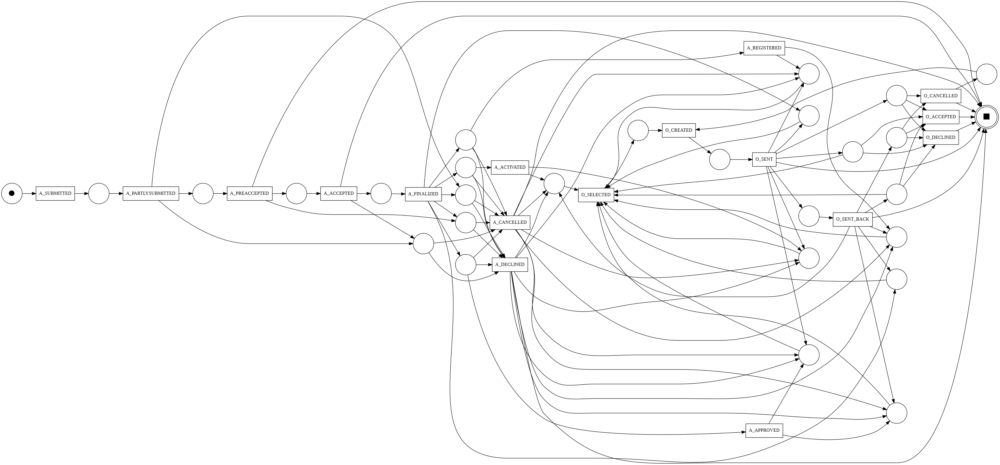


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 28
🔹 Number of transitions: 17
🔹 Number of arcs: 102
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 0, 'average_trace_fitness': 0.5914029400638068, 'log_fitness': 0.6533964697782556, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed traces ::   0%|          | 0/1113 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

📈 Generalization: 0.9832130069330101
✨ Simplicity: 0.2830188679245283


In [25]:
net, im, fm = discover_petri_net(event_log_AO, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_Full_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_AO, net, im, fm)

#### 7.1.2 Heuristic Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


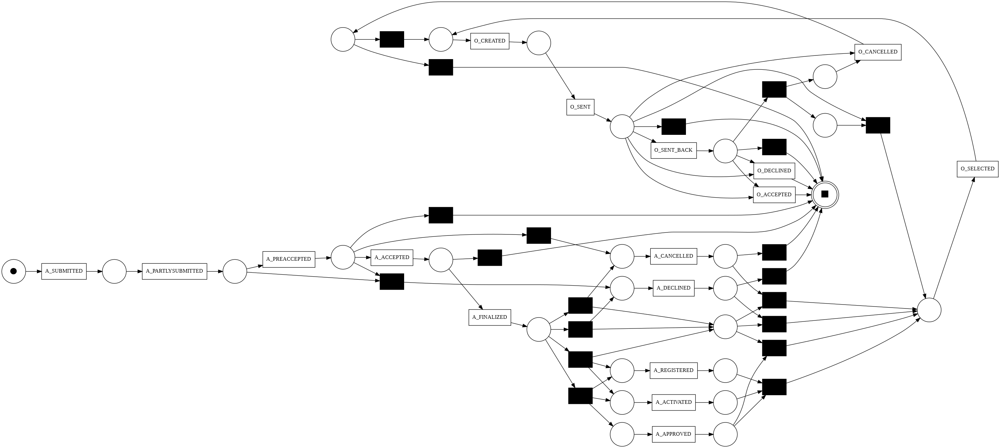


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 26
🔹 Number of transitions: 37
🔹 Number of arcs: 91
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/264 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 8.865134222793763, 'average_trace_fitness': 0.7862569312516763, 'log_fitness': 0.8036959221547296, 'percentage_of_fitting_traces': 8.865134222793763}


computing precision with alignments, completed variants ::   0%|          | 0/1113 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

📈 Generalization: 0.8546086692656298
✨ Simplicity: 0.5294117647058824


In [26]:
net, im, fm = discover_petri_net(event_log_AO, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_Full_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_AO, net, im, fm)

#### 7.1.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


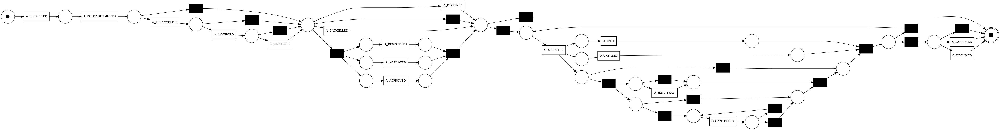


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 29
🔹 Number of transitions: 37
🔹 Number of arcs: 84
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/264 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9999432496895311, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/1113 [00:00<?, ?it/s]

🎯 Precision: 0.5413662921620013


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

📈 Generalization: 0.9780175011871262
✨ Simplicity: 0.6470588235294118


In [27]:
net, im, fm = discover_petri_net(event_log_AO, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_Full_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_AO, net, im, fm)

#### 7.1.4 Summary and Comparison

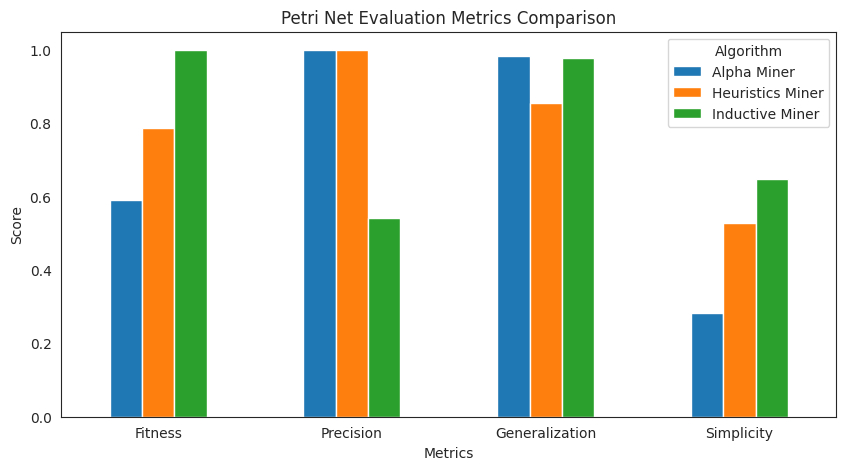

In [28]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_AO_overall_metrics.png"))

### 7.2 - LLM Integration for Textual Abstractions & Report Generation

#### 7.2.1 Compares abstract_case() output with actual trace data

In [29]:
validate_case_abstraction(event_log_AO, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - A_SUBMITTED; 2011-10-01 08:08:58.256000; COMPLETE; 112
    - A_PARTLYSUBMITTED; 2011-10-01 08:09:02.195000; COMPLETE; 112
    - A_PREACCEPTED; 2011-10-01 08:09:56.648000; COMPLETE; 112
    - A_ACCEPTED; 2011-10-01 14:33:54.614000; COMPLETE; 10862
    - A_FINALIZED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - A_APPROVED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_REGISTERED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_ACTIVATED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - O_SELECTED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - O_CREATED; 2011-10-01 14:35:47.488000; COMPLETE; 10862
    - O_SENT; 2011-10-01 14:35:47.583000; COMPLETE; 10862
    - O_SELECTED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CANCELLED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CREATED; 2011-10-03 16:56:19.613000; COMPLETE; 11120
    - O_SENT; 2011-10-03 16:56:19.645000; COMPLETE; 11120
    - O_SENT_BACK; 

#### 7.2.2 Checks abstract_variants() output against real process variants

In [30]:
validate_variants_abstraction(event_log_AO)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 264
                                                                                                                                                                                                                                                                                                                                                                                                                                                     Variant  Occurrences
                                                                                                                                                                                                                                                                                                                                                                                                                (A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINE

#### 7.2.3 Ensures abstract_log_attributes() matches real log attributes

In [31]:
validate_log_attributes_abstraction(event_log_AO)


📊 Log Attributes Validation:
🔹 Number of unique activities: 17
🔹 Most frequent activities:
 concept:name
A_SUBMITTED          12442
A_PARTLYSUBMITTED    12442
A_DECLINED            7289
A_PREACCEPTED         6903
O_SENT                6546
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-09 01:28:05.318000128'), 0.5: Timestamp('2011-12-18 15:40:41.084500224'), 0.75: Timestamp('2012-01-25 19:34:07.790000128'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}
case:trace_duration  empty: 0  quantiles: {0.0: 1.855, 0.25: 116212.367, 0.5: 1047820.9010000001, 0.75: 1795821.647, 1.0: 4928049.989}
concept:name  empty: 0 values: (A_SUBMITTED; freq. 12442) (A_PARTLYSUBMITTED; freq

#### 7.2.4 Compares abstract_petri_net() output with real Petri net structure

In [32]:
validate_petri_net_abstraction(net, im, fm)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_12', 'p_10', 'p_9', 'p_11', 'p_14', 'p_7', 'p_13', 'p_16', 'source', 'p_23', 'p_5', 'p_8', 'p_28', 'p_15', 'p_4', 'p_3', 'p_24', 'p_25', 'p_21', 'p_29', 'p_22', 'p_6', 'p_19', 'p_26', 'p_27', 'p_30', 'p_17', 'sink', 'p_20'}
🔹 Petri Net Transitions: {'O_SENT', 'A_ACCEPTED', 'O_CREATED', 'O_SELECTED', 'O_CANCELLED', 'A_APPROVED', 'A_FINALIZED', 'A_ACTIVATED', 'A_SUBMITTED', 'O_ACCEPTED', 'A_PARTLYSUBMITTED', 'A_CANCELLED', 'O_DECLINED', 'O_SENT_BACK', 'A_REGISTERED', 'A_DECLINED', 'A_PREACCEPTED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_14, p_15, p_16, p_17, p_19, p_20, p_21, p_22, p_23, p_24, p_25, p_26, p_27, p_28, p_29, p_3, p_30, p_4, p_5, p_6, p_7, p_8, p_9, sink, source ]
transitions: [ (03c51947-6206-4213-8386-d5562fedbe0c, 'A_APPROVED'), (27ac7d5a-dd9b-44fe-a460-a3eee2d6c892, 'A_SUBMITTED'), (2fba1a3d-21ce-4f91-b2e0-7724f8a88898, 'O_CREATED'), (449f7db8-4f00-4a8b-8c3e-a8d408cdfc

#### 7.2.5 Petri Net Evaluation using Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [33]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_AO_petri_net_alpha.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 971.15ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 663.75ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 613.99ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 618.72ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 612.91ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 663.88ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 613.71ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generat

This Petri net represents a complex process, likely involving the handling of applications (A) and orders (O).  The excessive number of arcs and the lack of clear structure make it difficult to analyze without simplification or more context on the meaning of each place and transition.  However, we can identify several potential issues:

**Process Flow Description:**

The process begins with an application being submitted (`A_SUBMITTED`). It progresses through stages of partial submission (`A_PARTLY_SUBMITTED`), pre-acceptance (`A_PREACCEPTED`), acceptance (`A_ACCEPTED`), and finalization (`A_FINALIZED`).  There are also states for cancellation (`A_CANCELLED`), declination (`A_DECLINED`), and activation (`A_ACTIVATED`).  Similarly, orders (O) follow a path from creation (`O_CREATED`), through sending (`O_SENT`), selection (`O_SELECTED`), acceptance/declination/cancellation, potentially with feedback loops (`O_SENT_BACK`).  The interaction between application and order processing is high

##### Heuristic Miner Evaluation

In [34]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_AO_petri_net_heuristics.png"))

ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 763.37ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 485.53ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 485.86ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 458.90ms
ERROR:tornado.access:503 POST /v1beta/models/gemini-1.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 459.33ms


This Petri net depicts a complex process, likely involving order (O) and application (A) processing. Let's break down the process flow, identify issues, and propose improvements.

**Process Flow Description:**

The process begins with an application being submitted (`A_SUBMITTED`).  It progresses through partially submitted (`A_PARTLYSUBMITTED`) and pre-accepted (`A_PREACCEPTED`) states.  It can then reach `A_ACCEPTED` and finally `A_FINALIZED`.  Simultaneously, an order is created (`O_CREATED`), sent (`O_SENT`), and can either be sent back (`O_SENT_BACK`) for revisions or proceed to acceptance (`O_ACCEPTED`). There are also cancellation paths for both applications (`A_CANCELLED`) and orders (`O_CANCELLED`).  The order and application processes appear largely independent, yet converge at a central point (the black square near the bottom right).  Applications also can be declined (`A_DECLINED`), registered (`A_REGISTERED`), activated (`A_ACTIVATED`), and approved (`A_APPROVED`). The fin

##### Inductive Miner Evaluation

In [35]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_AO_petri_net_inductive.png"))

This Petri net depicts a process with two parallel branches, seemingly representing the processing of two distinct types of applications (let's call them "A" and "O").  Each branch follows a similar but not identical flow, exhibiting several potential problems.

**Process Flow Description:**

* **Application A:** The process starts with "A_SUBMITTED". It moves through stages like "A_PARTLYSUBMITTED," "A_PREACCEPTED," "A_ACCEPTED," "A_FINALIZED," with potential for cancellation at any point ("A_CANCELLED").  After finalization, the application seems to reach a final state (the rightmost place with a black token).

* **Application O:** This branch starts with an implied submission (no explicit "O_SUBMITTED" state is shown). It proceeds through states such as "O_SELECTED," "O_CREATED," "O_SENT," potentially being sent back ("O_SENT_BACK"), then to "O_ACCEPTED" or "O_DECLINED" before reaching the final state (the rightmost place with a black token).

**Deadlocks and Livelocks:**

The net d

#### 7.2.6 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [36]:
print(summarize_metrics(api_key, "gemini-pro", overall_metrics))

**Comparative Report on Process Mining Algorithms**

**Metrics:**

* Fitness: Measures the accuracy of the discovered process model.
* Precision: Indicates the proportion of correctly predicted edges in the model.
* Generalization: Assesses the model's ability to represent unseen data.
* Simplicity: Denotes the complexity of the discovered model.

**Algorithm Analysis:**

**Alpha Miner:**

* **Strengths:**
    * High precision (1.0), indicating accuracy in identifying the correct edges.
    * Good generalization ability (0.9832).
* **Weaknesses:**
    * Relatively low fitness (0.5914), suggesting a lack of accuracy in capturing the overall process flow.
    * Low simplicity (0.2830), resulting in complex models that may be difficult to interpret.
* **Recommended for:** Situations where high precision and generalization are prioritized, even at the expense of model complexity.

**Heuristics Miner:**

* **Strengths:**
    * Best fitness (0.7862), demonstrating strong accuracy in discover



---



## **8 - org:resource Analysis**

#### 8.1 Analyzed **org:resource** and their properties: Underutilized/ Overloaded - Bottleneck


===== PLOTTING & SAVING: org:resource DISTRIBUTION =====


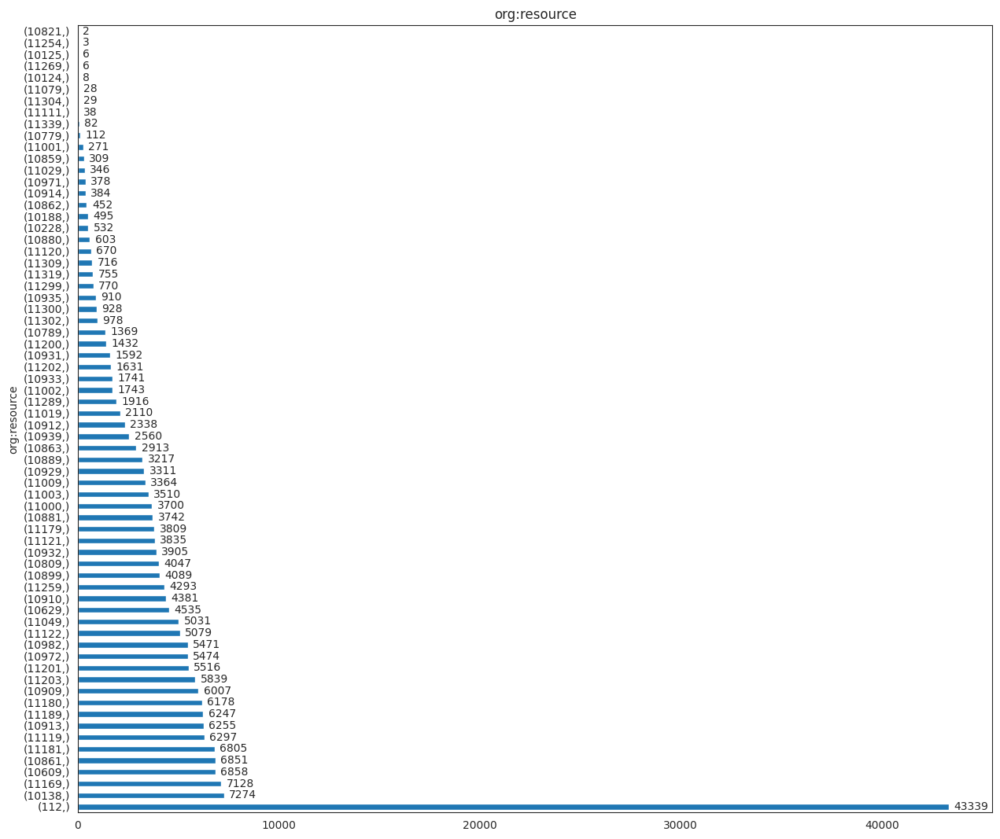

📌 Total items: 226543
⚠️ Low-frequency items (<2265 occurrences): 34 items
🔥 High-frequency items (>22654 occurrences): 1 items

🔹 Low-frequency items (examples):
org:resource
11019           2110
11289           1916
11002           1743
10933           1741
11202           1631
10931           1592
11200           1432
10789           1369
11302            978
11300            928
Name: count, dtype: int64

🔥 High-frequency items (examples):
org:resource
112             43339
Name: count, dtype: int64


In [37]:
resource_counts=show_values_count_distribution(log=cleaned_event_log, column="org:resource",
                               figsize=(15, 13), text_offset=250,
                               filepath=os.path.join("figure", "value_counts_org_resource.png"))

resource_outliers = classify_counts(count_series=resource_counts, total_count=cleaned_event_log.shape[0])

In [38]:
pd.crosstab(cleaned_event_log["org:resource"], cleaned_event_log["concept:name"])

concept:name,A_ACCEPTED,A_ACTIVATED,A_APPROVED,A_CANCELLED,A_DECLINED,A_FINALIZED,A_PARTLYSUBMITTED,A_PREACCEPTED,A_REGISTERED,A_SUBMITTED,...,O_SELECTED,O_SENT,O_SENT_BACK,W_Afhandelen leads,W_Beoordelen fraude,W_Completeren aanvraag,W_Nabellen incomplete dossiers,W_Nabellen offertes,W_Valideren aanvraag,W_Wijzigen contractgegevens
org:resource,,,,,,,,,,,,,,,,,,,,,
10124,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,3,2,1
10125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,4,2
10138,6,662,662,5,146,6,0,3,662,0,...,61,61,22,8,0,19,758,56,3209,0
10188,0,0,0,0,55,0,0,0,0,0,...,0,0,0,25,402,1,0,0,12,0
10228,5,0,0,2,47,3,0,38,0,0,...,3,3,1,210,0,178,15,11,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11302,25,0,0,6,13,25,0,2,0,0,...,34,34,0,24,1,491,22,251,3,0
11304,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,28,0,0,0,0,0
11309,12,0,0,19,7,11,0,0,0,0,...,16,16,0,0,0,361,8,234,0,0


In [39]:
pd.crosstab(cleaned_event_log["org:resource"], cleaned_event_log["concept:name"], normalize='columns')

concept:name,A_ACCEPTED,A_ACTIVATED,A_APPROVED,A_CANCELLED,A_DECLINED,A_FINALIZED,A_PARTLYSUBMITTED,A_PREACCEPTED,A_REGISTERED,A_SUBMITTED,...,O_SELECTED,O_SENT,O_SENT_BACK,W_Afhandelen leads,W_Beoordelen fraude,W_Completeren aanvraag,W_Nabellen incomplete dossiers,W_Nabellen offertes,W_Valideren aanvraag,W_Wijzigen contractgegevens
org:resource,,,,,,,,,,,,,,,,,,,,,
10124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000142,0.000000,0.000000,0.000000,0.000073,0.000108,0.1
10125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000215,0.2
10138,0.001248,0.308050,0.308050,0.001899,0.020030,0.001272,0.0,0.000435,0.308050,0.0,...,0.009319,0.009319,0.006790,0.000566,0.000000,0.000420,0.037661,0.001363,0.172871,0.0
10188,0.000000,0.000000,0.000000,0.000000,0.007546,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.001769,0.647343,0.000022,0.000000,0.000000,0.000646,0.0
10228,0.001040,0.000000,0.000000,0.000760,0.006448,0.000636,0.0,0.005505,0.000000,0.0,...,0.000458,0.000458,0.000309,0.014860,0.000000,0.003937,0.000745,0.000268,0.000593,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11302,0.005199,0.000000,0.000000,0.002279,0.001784,0.005299,0.0,0.000290,0.000000,0.0,...,0.005194,0.005194,0.000000,0.001698,0.001610,0.010861,0.001093,0.006109,0.000162,0.0
11304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000071,0.045089,0.000000,0.000000,0.000000,0.000000,0.0
11309,0.002495,0.000000,0.000000,0.007216,0.000960,0.002331,0.0,0.000000,0.000000,0.0,...,0.002444,0.002444,0.000000,0.000000,0.000000,0.007985,0.000397,0.005696,0.000000,0.0


In [40]:
pd.crosstab(cleaned_event_log["org:resource"], cleaned_event_log["concept:name"], normalize='index')

concept:name,A_ACCEPTED,A_ACTIVATED,A_APPROVED,A_CANCELLED,A_DECLINED,A_FINALIZED,A_PARTLYSUBMITTED,A_PREACCEPTED,A_REGISTERED,A_SUBMITTED,...,O_SELECTED,O_SENT,O_SENT_BACK,W_Afhandelen leads,W_Beoordelen fraude,W_Completeren aanvraag,W_Nabellen incomplete dossiers,W_Nabellen offertes,W_Valideren aanvraag,W_Wijzigen contractgegevens
org:resource,,,,,,,,,,,,,,,,,,,,,
10124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.375000,0.250000,0.125000
10125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.666667,0.333333
10138,0.000825,0.091009,0.091009,0.000687,0.020071,0.000825,0.0,0.000412,0.091009,0.0,...,0.008386,0.008386,0.003024,0.001100,0.000000,0.002612,0.104207,0.007699,0.441160,0.000000
10188,0.000000,0.000000,0.000000,0.000000,0.111111,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.050505,0.812121,0.002020,0.000000,0.000000,0.024242,0.000000
10228,0.009398,0.000000,0.000000,0.003759,0.088346,0.005639,0.0,0.071429,0.000000,0.0,...,0.005639,0.005639,0.001880,0.394737,0.000000,0.334586,0.028195,0.020677,0.020677,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11302,0.025562,0.000000,0.000000,0.006135,0.013292,0.025562,0.0,0.002045,0.000000,0.0,...,0.034765,0.034765,0.000000,0.024540,0.001022,0.502045,0.022495,0.256646,0.003067,0.000000
11304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.034483,0.965517,0.000000,0.000000,0.000000,0.000000,0.000000
11309,0.016760,0.000000,0.000000,0.026536,0.009777,0.015363,0.0,0.000000,0.000000,0.0,...,0.022346,0.022346,0.000000,0.000000,0.000000,0.504190,0.011173,0.326816,0.000000,0.000000
